

AI Driven Potholes Detection and Repair Prioritization

---

## Install Ultralytics Package

In [ ]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 616.5/616.5 kB 9.2 MB/s eta 0:00:00


### import libraries and load dataset

In [ ]:
import zipfile
import requests
import cv2
import matplotlib.pyplot as plt
import glob
import random
import os

import ultralytics
from ultralytics import YOLO
from IPython.display import display, Image
import cv2
import numpy as np
import matplotlib.pyplot as plt
ultralytics.checks()

Ultralytics YOLOv8.0.192 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla V100-SXM2-16GB, 16151MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 26.4/78.2 GB disk)


## Download the Dataset

* All images and labels as in version 7.
* Some larger cracked surfaces in both training and validation sets have been re-annoatated.

This dataset is a combination of:
* https://www.researchgate.net/publication/282807920_Dataset_of_images_used_for_pothole_detection (train set)
* https://public.roboflow.com/models/object-detection (train set)
* And manually annotated YouTube videos (validation set).
* All pothole images from RDD2022 dataset => https://github.com/sekilab/RoadDamageDetector


In [ ]:
os.makedirs('datasets', exist_ok=True)

In [ ]:
%cd datasets

/content/datasets


In [ ]:
def download_file(url, save_name):
    url = url
    if not os.path.exists(save_name):
        file = requests.get(url)
        open(save_name, 'wb').write(file.content)

download_file(
    'https://www.dropbox.com/s/qvglw8pqo16769f/pothole_dataset_v8.zip?dl=1',
    'pothole_dataset_v8.zip'
)

In [ ]:
# Unzip the data file
def unzip(zip_file=None):
    try:
        with zipfile.ZipFile(zip_file) as z:
            z.extractall("./")
            print("Extracted all")
    except:
        print("Invalid file")

unzip('pothole_dataset_v8.zip')

Extracted all


In [ ]:
%cd ..

/content


# Explorator data analysis

###Images

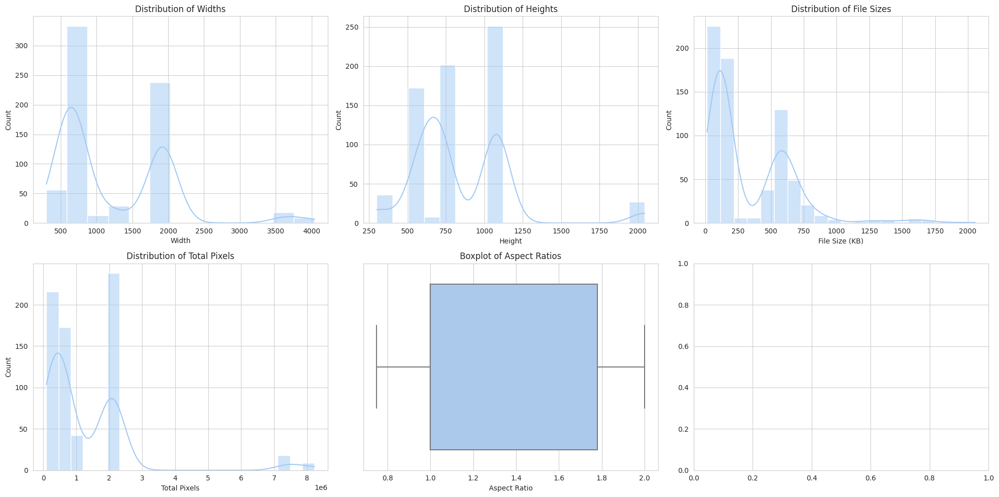

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

def plot_aggregated_data(df):
    sns.set_style("whitegrid")
    sns.set_palette("pastel")

    # Set up the matplotlib figure
    f, axes = plt.subplots(2, 3, figsize=(20, 10))

    # Distribution plots
    sns.histplot(df["Width"], kde=True, ax=axes[0, 0]).set_title("Distribution of Widths")
    sns.histplot(df["Height"], kde=True, ax=axes[0, 1]).set_title("Distribution of Heights")
    sns.histplot(df["File Size (KB)"], kde=True, ax=axes[0, 2]).set_title("Distribution of File Sizes")
    sns.histplot(df["Total Pixels"], kde=True, ax=axes[1, 0]).set_title("Distribution of Total Pixels")

    # Boxplot for Aspect Ratio
    sns.boxplot(x=df["Aspect Ratio"], ax=axes[1, 1]).set_title("Boxplot of Aspect Ratios")

    # Adjust layout
    f.tight_layout()

    plt.show()

# Assuming df contains the dataset
plot_aggregated_data(df)


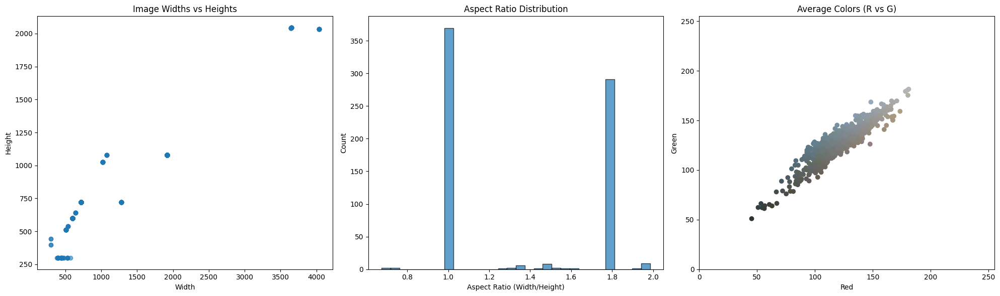

In [ ]:
import os
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

def eda_image_directory(directory_path):
    # Get all files in the directory
    all_files = [f for f in os.listdir(directory_path) if os.path.isfile(os.path.join(directory_path, f))]
    image_files = [f for f in all_files if f.lower().endswith(('.png', '.jpg', '.jpeg', '.tiff', '.bmp', '.gif'))]

    # Check if the list of image files is empty
    if not image_files:
        print("The directory either doesn't contain any files or lacks recognizable image files.")
        return

    # Sample 10% of the image files
    num_samples = max(1, len(image_files) // 10)
    sampled_files = np.random.choice(image_files, num_samples, replace=False)

    widths = []
    heights = []
    aspect_ratios = []
    avg_colors = []

    for file in sampled_files:
        with Image.open(os.path.join(directory_path, file)) as img:
            width, height = img.size
            widths.append(width)
            heights.append(height)
            aspect_ratios.append(width / height)

            # Compute average color
            np_img = np.array(img)
            if len(np_img.shape) == 3:  # Only for RGB or RGBA images
                avg_color = np.mean(np_img[:,:,:3], axis=(0,1))
                avg_colors.append(avg_color)

    # Plotting
    plt.figure(figsize=(20, 6))

    # Image Widths & Heights
    plt.subplot(1, 3, 1)
    plt.scatter(widths, heights, alpha=0.6)
    plt.title("Image Widths vs Heights")
    plt.xlabel("Width")
    plt.ylabel("Height")

    # Aspect Ratios
    plt.subplot(1, 3, 2)
    plt.hist(aspect_ratios, bins=30, edgecolor="k", alpha=0.7)
    plt.title("Aspect Ratio Distribution")
    plt.xlabel("Aspect Ratio (Width/Height)")
    plt.ylabel("Count")

    # Average Colors
    if avg_colors:
        avg_colors = np.array(avg_colors)
        plt.subplot(1, 3, 3)
        plt.scatter(avg_colors[:,0], avg_colors[:,1], c=avg_colors/255, marker='o')
        plt.title("Average Colors (R vs G)")
        plt.xlabel("Red")
        plt.ylabel("Green")
        plt.xlim(0, 255)
        plt.ylim(0, 255)

    plt.tight_layout()
    plt.show()

# Usage
# eda_image_directory("/content/datasets/pothole_dataset_v8/train")

# Usage
eda_image_directory("/content/datasets/pothole_dataset_v8/train/images")


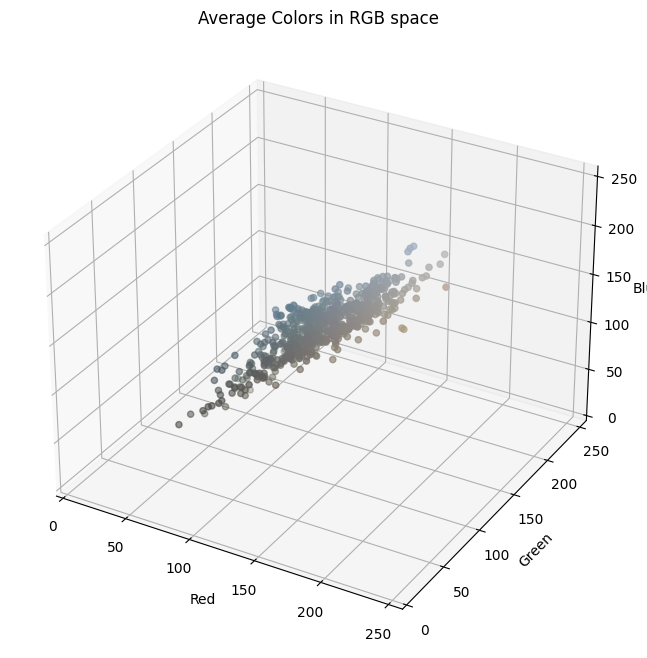

In [ ]:
import os
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

def eda_image_directory(directory_path):
    # Get all files in the directory
    all_files = [f for f in os.listdir(directory_path) if os.path.isfile(os.path.join(directory_path, f))]
    image_files = [f for f in all_files if f.lower().endswith(('.png', '.jpg', '.jpeg', '.tiff', '.bmp', '.gif'))]

    # Check if the list of image files is empty
    if not image_files:
        print("The directory either doesn't contain any files or lacks recognizable image files.")
        return

    # Sample 10% of the image files
    num_samples = max(1, len(image_files) // 10)
    sampled_files = np.random.choice(image_files, num_samples, replace=False)

    avg_colors = []

    for file in sampled_files:
        with Image.open(os.path.join(directory_path, file)) as img:
            # Compute average color
            np_img = np.array(img)
            if len(np_img.shape) == 3:  # Only for RGB or RGBA images
                avg_color = np.mean(np_img[:,:,:3], axis=(0,1))
                avg_colors.append(avg_color)

    # Plotting
    if avg_colors:
        avg_colors = np.array(avg_colors)
        fig = plt.figure(figsize=(10, 8))
        ax = fig.add_subplot(111, projection='3d')
        ax.scatter(avg_colors[:,0], avg_colors[:,1], avg_colors[:,2], c=avg_colors/255, marker='o')
        ax.set_title("Average Colors in RGB space")
        ax.set_xlabel("Red")
        ax.set_ylabel("Green")
        ax.set_zlabel("Blue")
        ax.set_xlim(0, 255)
        ax.set_ylim(0, 255)
        ax.set_zlim(0, 255)

    plt.show()

# Usage
eda_image_directory("/content/datasets/pothole_dataset_v8/train/images")


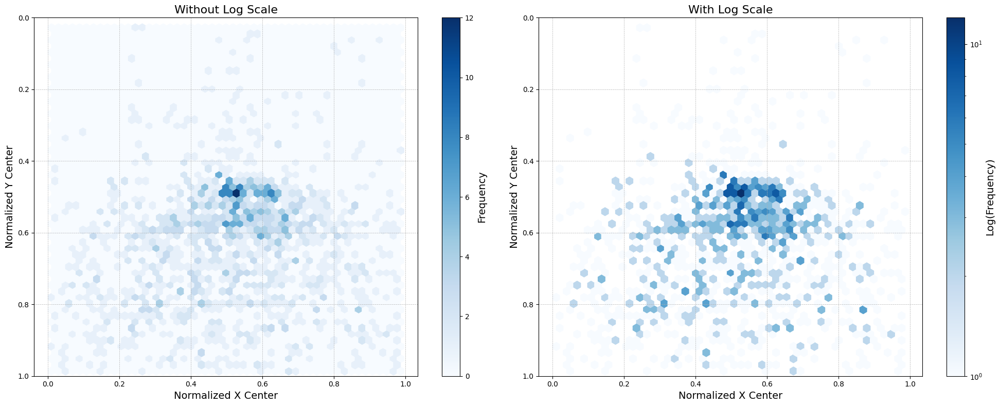

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt

def analyze_bboxes(directory_path):
    all_files = [f for f in os.listdir(directory_path) if os.path.isfile(os.path.join(directory_path, f))]
    label_files = [f for f in all_files if f.lower().endswith('.txt')]

    if not label_files:
        print("The directory either doesn't contain any files or lacks recognizable label files.")
        return

    num_samples = max(1, len(label_files) // 10)
    sampled_files = np.random.choice(label_files, num_samples, replace=False)

    x_centers = []
    y_centers = []

    for file in sampled_files:
        with open(os.path.join(directory_path, file), 'r') as f:
            lines = f.readlines()
            for line in lines:
                parts = line.strip().split()
                if len(parts) == 5:  # Ensure it's a valid line
                    _, x_center, y_center, _, _ = map(float, parts)
                    x_centers.append(x_center)
                    y_centers.append(y_center)

    # Plotting
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))

    # Hexbin plot without log scale
    hb1 = ax1.hexbin(x_centers, y_centers, gridsize=50, cmap='Blues')
    cb1 = plt.colorbar(hb1, ax=ax1)
    cb1.set_label('Frequency', fontsize=14)
    ax1.set_title("Without Log Scale", fontsize=16)
    ax1.set_xlabel("Normalized X Center", fontsize=14)
    ax1.set_ylabel("Normalized Y Center", fontsize=14)
    ax1.grid(True, which='both', linestyle='--', linewidth=0.5)
    ax1.set_ylim(1, 0)  # To invert the y-axis

    # Hexbin plot with log scale
    hb2 = ax2.hexbin(x_centers, y_centers, gridsize=50, cmap='Blues', bins='log')
    cb2 = plt.colorbar(hb2, ax=ax2)
    cb2.set_label('Log(Frequency)', fontsize=14)
    ax2.set_title("With Log Scale", fontsize=16)
    ax2.set_xlabel("Normalized X Center", fontsize=14)
    ax2.set_ylabel("Normalized Y Center", fontsize=14)
    ax2.grid(True, which='both', linestyle='--', linewidth=0.5)
    ax2.set_ylim(1, 0)  # To invert the y-axis

    plt.tight_layout()
    plt.show()

# Usage
analyze_bboxes("/content/datasets/pothole_dataset_v8/train/labels")


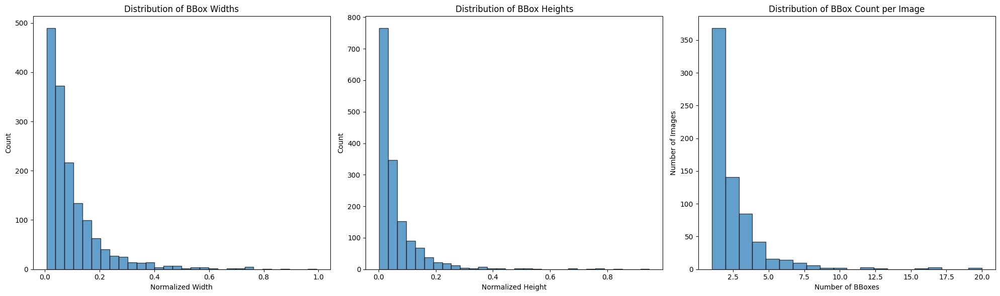

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt

def analyze_bbox_sizes_and_count(directory_path):
    all_files = [f for f in os.listdir(directory_path) if os.path.isfile(os.path.join(directory_path, f))]
    label_files = [f for f in all_files if f.lower().endswith('.txt')]

    if not label_files:
        print("The directory either doesn't contain any files or lacks recognizable label files.")
        return

    num_samples = max(1, len(label_files) // 10)
    sampled_files = np.random.choice(label_files, num_samples, replace=False)

    widths = []
    heights = []
    bbox_counts = []

    for file in sampled_files:
        count = 0
        with open(os.path.join(directory_path, file), 'r') as f:
            lines = f.readlines()
            for line in lines:
                parts = line.strip().split()
                if len(parts) == 5:  # Ensure it's a valid line
                    _, _, _, width, height = map(float, parts)
                    widths.append(width)
                    heights.append(height)
                    count += 1
        bbox_counts.append(count)

    # Plotting
    plt.figure(figsize=(20, 6))

    # Histogram for widths
    plt.subplot(1, 3, 1)
    plt.hist(widths, bins=30, edgecolor="k", alpha=0.7)
    plt.title("Distribution of BBox Widths")
    plt.xlabel("Normalized Width")
    plt.ylabel("Count")

    # Histogram for heights
    plt.subplot(1, 3, 2)
    plt.hist(heights, bins=30, edgecolor="k", alpha=0.7)
    plt.title("Distribution of BBox Heights")
    plt.xlabel("Normalized Height")
    plt.ylabel("Count")

    # Histogram for bbox count per image
    plt.subplot(1, 3, 3)
    plt.hist(bbox_counts, bins=max(bbox_counts), edgecolor="k", alpha=0.7)
    plt.title("Distribution of BBox Count per Image")
    plt.xlabel("Number of BBoxes")
    plt.ylabel("Number of Images")

    plt.tight_layout()
    plt.show()

# Usage
analyze_bbox_sizes_and_count("/content/datasets/pothole_dataset_v8/train/labels")


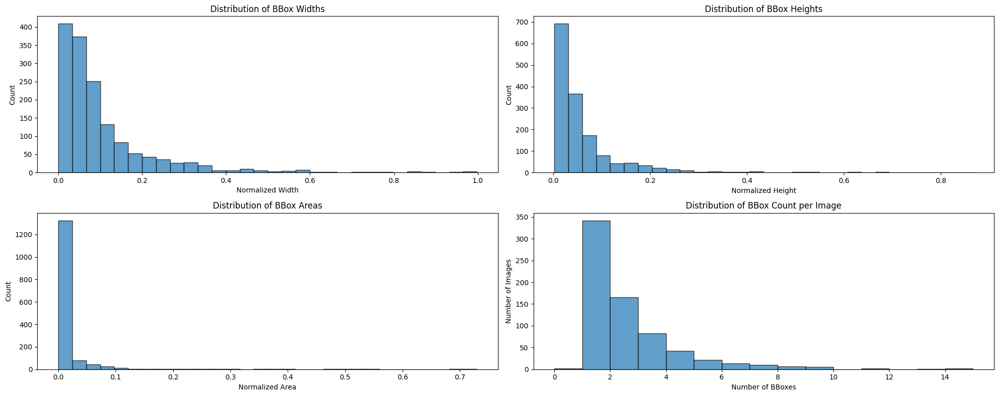

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt

def analyze_bbox_sizes_and_count(directory_path):
    all_files = [f for f in os.listdir(directory_path) if os.path.isfile(os.path.join(directory_path, f))]
    label_files = [f for f in all_files if f.lower().endswith('.txt')]

    if not label_files:
        print("The directory either doesn't contain any files or lacks recognizable label files.")
        return

    num_samples = max(1, len(label_files) // 10)
    sampled_files = np.random.choice(label_files, num_samples, replace=False)

    widths = []
    heights = []
    areas = []
    bbox_counts = []

    for file in sampled_files:
        count = 0
        with open(os.path.join(directory_path, file), 'r') as f:
            lines = f.readlines()
            for line in lines:
                parts = line.strip().split()
                if len(parts) == 5:  # Ensure it's a valid line
                    _, _, _, width, height = map(float, parts)
                    widths.append(width)
                    heights.append(height)
                    areas.append(width * height)
                    count += 1
        bbox_counts.append(count)

    # Plotting
    plt.figure(figsize=(20, 8))

    # Histogram for widths
    plt.subplot(2, 2, 1)
    plt.hist(widths, bins=30, edgecolor="k", alpha=0.7)
    plt.title("Distribution of BBox Widths")
    plt.xlabel("Normalized Width")
    plt.ylabel("Count")

    # Histogram for heights
    plt.subplot(2, 2, 2)
    plt.hist(heights, bins=30, edgecolor="k", alpha=0.7)
    plt.title("Distribution of BBox Heights")
    plt.xlabel("Normalized Height")
    plt.ylabel("Count")

    # Histogram for bbox areas
    plt.subplot(2, 2, 3)
    plt.hist(areas, bins=30, edgecolor="k", alpha=0.7)
    plt.title("Distribution of BBox Areas")
    plt.xlabel("Normalized Area")
    plt.ylabel("Count")

    # Histogram for bbox count per image
    plt.subplot(2, 2, 4)
    plt.hist(bbox_counts, bins=max(bbox_counts), edgecolor="k", alpha=0.7)
    plt.title("Distribution of BBox Count per Image")
    plt.xlabel("Number of BBoxes")
    plt.ylabel("Number of Images")

    plt.tight_layout()
    plt.show()

# Usage
analyze_bbox_sizes_and_count("/content/datasets/pothole_dataset_v8/train/labels")


###Aspect ratio analysis

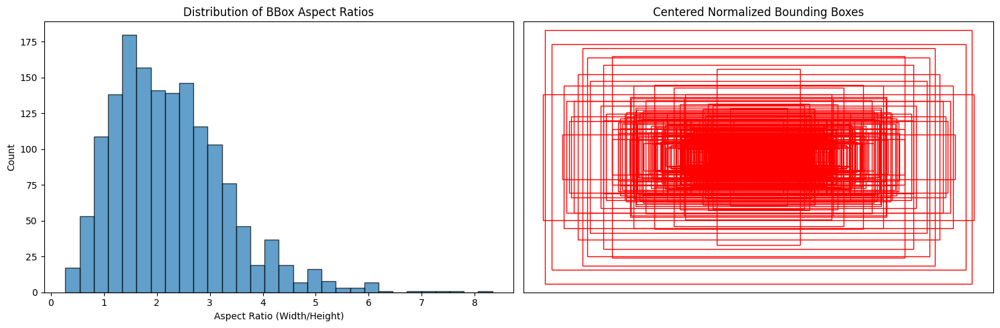

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle

def analyze_bbox_shapes(image_directory, label_directory):
    all_files = [f for f in os.listdir(label_directory) if os.path.isfile(os.path.join(label_directory, f))]
    label_files = [f for f in all_files if f.lower().endswith('.txt')]

    if not label_files:
        print("The directory either doesn't contain any files or lacks recognizable label files.")
        return

    num_samples = len(label_files) // 10
    sampled_files = np.random.choice(label_files, num_samples, replace=False)

    aspect_ratios = []
    normalized_boxes = []

    for file in sampled_files:
        with open(os.path.join(label_directory, file), 'r') as f:
            lines = f.readlines()
            for line in lines:
                parts = line.strip().split()
                if len(parts) == 5:  # Ensure it's a valid line
                    _, _, _, width, height = map(float, parts)
                    aspect_ratios.append(width / height)
                    normalized_boxes.append((width, height))

    # Plotting
    fig, axs = plt.subplots(1, 2, figsize=(15, 5))

    # Histogram for bbox aspect ratios
    axs[0].hist(aspect_ratios, bins=30, edgecolor="k", alpha=0.7)
    axs[0].set_title("Distribution of BBox Aspect Ratios")
    axs[0].set_xlabel("Aspect Ratio (Width/Height)")
    axs[0].set_ylabel("Count")

    # Visualizing normalized bounding boxes
    for width, height in normalized_boxes:
        rect = Rectangle((0.5 - width/2, 0.5 - height/2), width, height, fill=False, edgecolor='red', linewidth=1)
        axs[1].add_patch(rect)
    axs[1].set_xlim(0, 1)
    axs[1].set_ylim(0, 1)
    axs[1].set_title("Centered Normalized Bounding Boxes")
    axs[1].set_xticks([])
    axs[1].set_yticks([])

    plt.tight_layout()
    plt.show()

# Usage
analyze_bbox_shapes("/content/datasets/pothole_dataset_v8/train/images", "/content/datasets/pothole_dataset_v8/train/labels")


In [ ]:
import os
import numpy as np
import pandas as pd
from PIL import Image

def sampled_image_info(directory_path, sample_fraction=0.10):
    # Get all files in the directory
    all_files = [f for f in os.listdir(directory_path) if os.path.isfile(os.path.join(directory_path, f))]
    image_files = [f for f in all_files if f.lower().endswith(('.png', '.jpg', '.jpeg', '.tiff', '.bmp', '.gif'))]

    # Sample a fraction of the image files
    num_samples = max(1, int(len(image_files) * sample_fraction))
    sampled_files = np.random.choice(image_files, num_samples, replace=False)

    # Lists to store information
    filenames = []
    widths = []
    heights = []
    aspect_ratios = []
    formats = []
    file_sizes = []
    total_pixels = []

    for file in sampled_files:
        file_path = os.path.join(directory_path, file)
        with Image.open(file_path) as img:
            filenames.append(file)
            width, height = img.size
            widths.append(width)
            heights.append(height)
            aspect_ratios.append(round(width / height, 2))
            formats.append(img.format)
            file_sizes.append(round(os.path.getsize(file_path) / 1024, 2))  # size in kilobytes
            total_pixels.append(width * height)

    # Create a pandas DataFrame
    df = pd.DataFrame({
        "Filename": filenames,
        "Width": widths,
        "Height": heights,
        "Aspect Ratio": aspect_ratios,
        "Format": formats,
        "File Size (KB)": file_sizes,
        "Total Pixels": total_pixels
    })

    return df

# Usage
df = sampled_image_info("/content/datasets/pothole_dataset_v8/train/images")
print(df)


             Filename  Width  Height  Aspect Ratio Format  File Size (KB)  \
0        G0089868.jpg   1920    1080          1.78   JPEG          588.21   
1        G0029511.jpg   1920    1080          1.78   JPEG          741.44   
2        G0041235.jpg   1920    1080          1.78   JPEG          615.53   
3    India_003700.jpg    720     720          1.00   JPEG          136.97   
4    India_002118.jpg    720     720          1.00   JPEG           90.25   
..                ...    ...     ...           ...    ...             ...   
691  India_005258.jpg    720     720          1.00   JPEG           91.88   
692      G0031363.jpg   1920    1080          1.78   JPEG          559.58   
693  India_002696.jpg    720     720          1.00   JPEG           94.84   
694  India_007537.jpg    720     720          1.00   JPEG          129.39   
695      G0028908.jpg   1920    1080          1.78   JPEG          620.58   

     Total Pixels  
0         2073600  
1         2073600  
2         20736

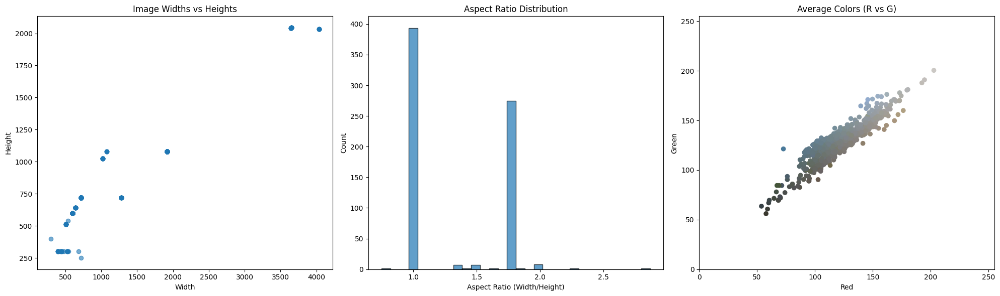

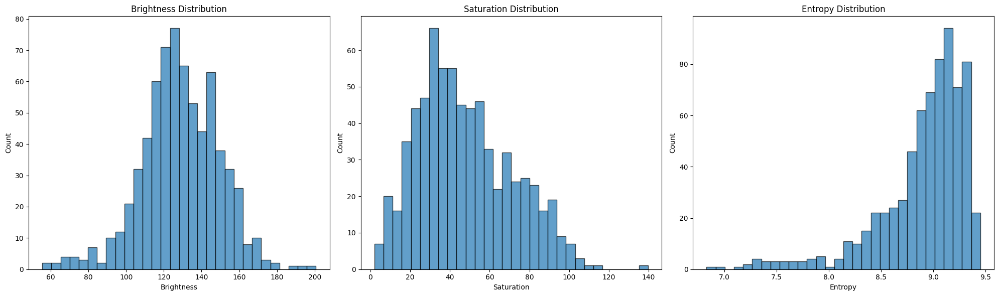

In [ ]:
import os
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

def compute_brightness(img):
    grayscale = img.convert("L")
    return np.mean(np.array(grayscale))

def compute_saturation(img):
    hsv = img.convert("HSV")
    return np.mean(np.array(hsv)[:,:,1])

def compute_entropy(img):
    histogram = img.histogram()
    hist_sum = sum(histogram)
    histogram = [float(h) / hist_sum for h in histogram]
    return -sum([p * np.log2(p) for p in histogram if p != 0])

def eda_image_directory(directory_path):
    # Get all files in the directory
    all_files = [f for f in os.listdir(directory_path) if os.path.isfile(os.path.join(directory_path, f))]
    image_files = [f for f in all_files if f.lower().endswith(('.png', '.jpg', '.jpeg', '.tiff', '.bmp', '.gif'))]

    # Check if the list of image files is empty
    if not image_files:
        print("The directory either doesn't contain any files or lacks recognizable image files.")
        return

    # Sample 10% of the image files
    num_samples = max(1, len(image_files) // 10)
    sampled_files = np.random.choice(image_files, num_samples, replace=False)

    widths = []
    heights = []
    aspect_ratios = []
    avg_colors = []
    brightness = []
    saturations = []
    entropies = []

    for file in sampled_files:
        with Image.open(os.path.join(directory_path, file)) as img:
            width, height = img.size
            widths.append(width)
            heights.append(height)
            aspect_ratios.append(width / height)

            # Compute average color
            np_img = np.array(img)
            if len(np_img.shape) == 3:  # Only for RGB or RGBA images
                avg_color = np.mean(np_img[:,:,:3], axis=(0,1))
                avg_colors.append(avg_color)

            # Compute brightness, saturation, and entropy
            brightness.append(compute_brightness(img))
            saturations.append(compute_saturation(img))
            entropies.append(compute_entropy(img))

    # Plotting for Size, Aspect Ratio, and Colors
    plt.figure(figsize=(20, 6))

    plt.subplot(1, 3, 1)
    plt.scatter(widths, heights, alpha=0.6)
    plt.title("Image Widths vs Heights")
    plt.xlabel("Width")
    plt.ylabel("Height")

    plt.subplot(1, 3, 2)
    plt.hist(aspect_ratios, bins=30, edgecolor="k", alpha=0.7)
    plt.title("Aspect Ratio Distribution")
    plt.xlabel("Aspect Ratio (Width/Height)")
    plt.ylabel("Count")

    if avg_colors:
        avg_colors = np.array(avg_colors)
        plt.subplot(1, 3, 3)
        plt.scatter(avg_colors[:,0], avg_colors[:,1], c=avg_colors/255, marker='o')
        plt.title("Average Colors (R vs G)")
        plt.xlabel("Red")
        plt.ylabel("Green")
        plt.xlim(0, 255)
        plt.ylim(0, 255)
    plt.tight_layout()
    plt.show()

    # Plotting for Brightness, Saturation, and Entropy
    plt.figure(figsize=(20, 6))

    plt.subplot(1, 3, 1)
    plt.hist(brightness, bins=30, edgecolor="k", alpha=0.7)
    plt.title("Brightness Distribution")
    plt.xlabel("Brightness")
    plt.ylabel("Count")

    plt.subplot(1, 3, 2)
    plt.hist(saturations, bins=30, edgecolor="k", alpha=0.7)
    plt.title("Saturation Distribution")
    plt.xlabel("Saturation")
    plt.ylabel("Count")

    plt.subplot(1, 3, 3)
    plt.hist(entropies, bins=30, edgecolor="k", alpha=0.7)
    plt.title("Entropy Distribution")
    plt.xlabel("Entropy")
    plt.ylabel("Count")

    plt.tight_layout()
    plt.show()

# Usage
eda_image_directory("/content/datasets/pothole_dataset_v8/train/images")


## Visualize Images from the Dataset

In [ ]:
# Function to convert bounding boxes in YOLO format to xmin, ymin, xmax, ymax.
def yolo2bbox(bboxes):
    xmin, ymin = bboxes[0]-bboxes[2]/2, bboxes[1]-bboxes[3]/2
    xmax, ymax = bboxes[0]+bboxes[2]/2, bboxes[1]+bboxes[3]/2
    return xmin, ymin, xmax, ymax

In [ ]:
def plot_box(image, bboxes, labels):
    # Need the image height and width to denormalize
    # the bounding box coordinates
    h, w, _ = image.shape
    for box_num, box in enumerate(bboxes):
        x1, y1, x2, y2 = yolo2bbox(box)
        # Denormalize the coordinates.
        xmin = int(x1*w)
        ymin = int(y1*h)
        xmax = int(x2*w)
        ymax = int(y2*h)

        thickness = max(2, int(w/275))

        cv2.rectangle(
            image,
            (xmin, ymin), (xmax, ymax),
            color=(0, 0, 255),
            thickness=thickness
        )
    return image

In [ ]:
# Function to plot images with the bounding boxes.
def plot(image_paths, label_paths, num_samples):
    all_images = []
    all_images.extend(glob.glob(image_paths+'/*.jpg'))
    all_images.extend(glob.glob(image_paths+'/*.JPG'))

    all_images.sort()

    num_images = len(all_images)

    plt.figure(figsize=(15, 12))
    for i in range(num_samples):
        j = random.randint(0,num_images-1)
        image_name = all_images[j]
        image_name = '.'.join(image_name.split(os.path.sep)[-1].split('.')[:-1])
        image = cv2.imread(all_images[j])
        with open(os.path.join(label_paths, image_name+'.txt'), 'r') as f:
            bboxes = []
            labels = []
            label_lines = f.readlines()
            for label_line in label_lines:
                label = label_line[0]
                bbox_string = label_line[2:]
                x_c, y_c, w, h = bbox_string.split(' ')
                x_c = float(x_c)
                y_c = float(y_c)
                w = float(w)
                h = float(h)
                bboxes.append([x_c, y_c, w, h])
                labels.append(label)
        result_image = plot_box(image, bboxes, labels)
        plt.subplot(2, 2, i+1)
        plt.imshow(result_image[:, :, ::-1])
        plt.axis('off')
    plt.subplots_adjust(wspace=1)
    plt.tight_layout()
    plt.show()

## Visualize Validation Results

In [ ]:
# Plot and visualize images in a 2x2 grid.
def visualize(result_dir, num_samples=4):
    """
    Function accepts a list of images and plots
    them in a 2x2 grid.
    """
    plt.figure(figsize=(20, 12))
    image_names = glob.glob(os.path.join(result_dir, '*.jpg'))
    random.shuffle(image_names)
    for i, image_name in enumerate(image_names):
        image = plt.imread(image_name)
        plt.subplot(2, 2, i+1)
        plt.imshow(image)
        plt.axis('off')
        if i == num_samples-1:
            break
    plt.tight_layout()
    plt.show()

### Augmented analysis

In [ ]:
pip install albumentations


In [ ]:
import albumentations as A
import cv2
from albumentations.pytorch.transforms import ToTensorV2


In [ ]:
bbox_params = A.BboxParams(format='pascal_voc', min_area=0, min_visibility=0.5, label_fields=['class_labels'])

augmentation = A.Compose([
    A.Blur(blur_limit=7, p=1),
    A.RandomBrightnessContrast(brightness_limit=0.1, contrast_limit=0.1, p=1),
    A.RandomCrop(height=1024, width=1024, p=1),
    A.GaussNoise(var_limit=(10.0, 50.0), p=1),
    A.HueSaturationValue(hue_shift_limit=20, sat_shift_limit=50, p=1),
    A.MotionBlur(blur_limit=7, p=1),
    A.IAAAffine(shear=10, p=1)
], bbox_params=bbox_params)


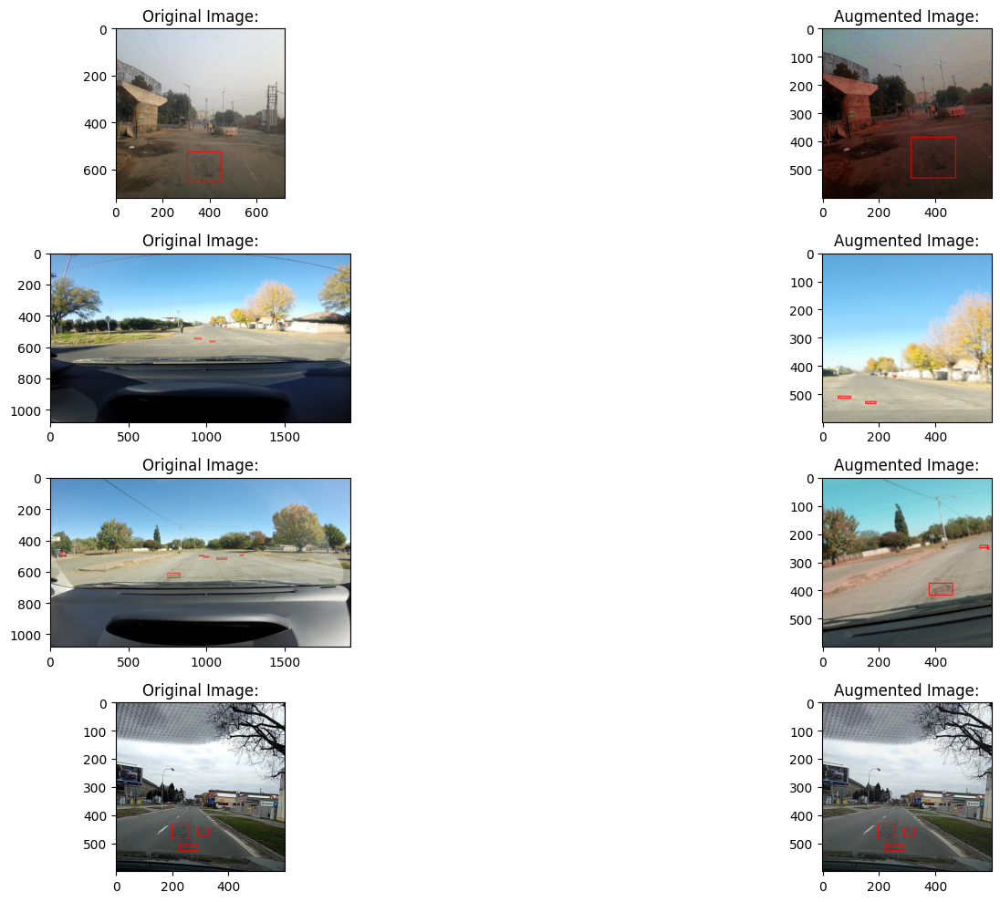

In [ ]:
import os
import cv2
import numpy as np
import albumentations as A
import matplotlib.pyplot as plt

def visualize_augmented_samples(image_directory, label_directory, num_samples=4):

    all_images = [f for f in os.listdir(image_directory) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
    sampled_images = np.random.choice(all_images, num_samples, replace=False)

    # Find the minimum dimensions among sampled images
    min_height, min_width = float('inf'), float('inf')
    for image_file in sampled_images:
        image_path = os.path.join(image_directory, image_file)
        image = cv2.imread(image_path)
        h, w = image.shape[:2]
        min_height, min_width = min(min_height, h), min(min_width, w)

    # Adjust the cropping size based on the smallest image dimensions
    crop_height = min_height
    crop_width = min_width

    bbox_params = A.BboxParams(format='pascal_voc', min_area=0, min_visibility=0.1, label_fields=['labels'])

    augmentation = A.Compose([
        A.Blur(blur_limit=7),
        A.RandomBrightnessContrast(brightness_limit=0.1, contrast_limit=0.1),
        A.RandomCrop(height=crop_height, width=crop_width),
        A.GaussNoise(var_limit=(10.0, 50.0)),
        A.HueSaturationValue(hue_shift_limit=20, sat_shift_limit=50),
        A.MotionBlur(blur_limit=7),
        A.IAAAffine(shear=10)
    ], bbox_params=bbox_params)

    plt.figure(figsize=(20, 10))

    for idx, image_file in enumerate(sampled_images):
        image_path = os.path.join(image_directory, image_file)
        label_path = os.path.join(label_directory, image_file.replace('.jpg', '.txt').replace('.png', '.txt'))

        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        with open(label_path, 'r') as file:
            bboxes = []
            for line in file.readlines():
                class_id, x_center, y_center, width, height = map(float, line.strip().split())
                x_min = (x_center - width / 2) * image.shape[1]
                y_min = (y_center - height / 2) * image.shape[0]
                x_max = x_min + width * image.shape[1]
                y_max = y_min + height * image.shape[0]
                bboxes.append([x_min, y_min, x_max, y_max])

        augmented = augmentation(image=image, bboxes=bboxes, labels=[0] * len(bboxes))
        augmented_image = augmented["image"]
        augmented_bboxes = augmented["bboxes"]

        plt.subplot(num_samples, 2, 2 * idx + 1)
        plt.imshow(image)
        plt.subplot(num_samples, 2, 2 * idx + 1)
        for box in bboxes:
            cv2.rectangle(image, (int(box[0]), int(box[1])), (int(box[2]), int(box[3])), (255, 0, 0), 2)
        plt.imshow(image)
        plt.title(f"Original Image:")

        plt.subplot(num_samples, 2, 2 * idx + 2)
        for box in augmented_bboxes:
            cv2.rectangle(augmented_image, (int(box[0]), int(box[1])), (int(box[2]), int(box[3])), (255, 0, 0), 2)
        plt.imshow(augmented_image)
        plt.title(f"Augmented Image:")

    plt.tight_layout()
    plt.show()

# Usage
visualize_augmented_samples("/content/datasets/pothole_dataset_v8/train/images", "/content/datasets/pothole_dataset_v8/train/labels", 4)


#Clear ML for results comparison

In [ ]:
pip install clearml

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 15.2 MB/s eta 0:00:00
  Attempting uninstall: pyjwt
    Found existing installation: PyJWT 2.3.0
    Uninstalling PyJWT-2.3.0:
      Successfully uninstalled PyJWT-2.3.0


In [ ]:
%env CLEARML_WEB_HOST=https://app.clear.ml
%env CLEARML_API_HOST=https://api.clear.ml
%env CLEARML_FILES_HOST=https://files.clear.ml
%env CLEARML_API_ACCESS_KEY=2TYLO5RT4T330P4LEZUC
%env CLEARML_API_SECRET_KEY=al8To3GAVFr0LixLMbGNUU4THqwHFFQT3BXLivK636pQk6dMQ8

env: CLEARML_WEB_HOST=https://app.clear.ml
env: CLEARML_API_HOST=https://api.clear.ml
env: CLEARML_FILES_HOST=https://files.clear.ml
env: CLEARML_API_ACCESS_KEY=2TYLO5RT4T330P4LEZUC
env: CLEARML_API_SECRET_KEY=al8To3GAVFr0LixLMbGNUU4THqwHFFQT3BXLivK636pQk6dMQ8


# YOLOv8 Nano Training

## Dataset YAML File

In [ ]:
import os

# Get the current working directory
current_directory = os.getcwd()

# Print the current working directory
print("Current Working Directory:", current_directory)


Current Working Directory: /content


In [ ]:
%%writefile pothole_v8.yaml
path: '/content/datasets/pothole_dataset_v8/'
train: 'train/images'
val: 'valid/images'

# class names
names:
  0: 'pothole'

Writing pothole_v8.yaml


In [ ]:
# Sample training for 5 epoch.
! yolo task=detect mode=train model=yolov8n.pt imgsz=1280 data=pothole_v8.yaml epochs=150 patience=10 batch=8   name=yolov8s_v8_50e

Ultralytics YOLOv8.0.188 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=pothole_v8.yaml, epochs=150, patience=10, batch=4, imgsz=1280, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=yolov8s_v8_50e, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscript, keras

### Evaluation on Validation Images

In [ ]:
!yolo task=detect mode=val model=/content/runs/detect/yolov8s_v8_50e3/weights/best.pt name=yolov8n_eval data=pothole_v8.yaml

Ultralytics YOLOv8.0.188 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 168 layers, 3005843 parameters, 0 gradients
val: Scanning /content/datasets/pothole_dataset_v8/valid/labels.cache... 271 images, 0 backgrounds, 0 corrupt: 100% 271/271 [00:00<?, ?it/s]
val: WARNING ⚠️ /content/datasets/pothole_dataset_v8/valid/images/G0011603.jpg: 1 duplicate labels removed
val: WARNING ⚠️ /content/datasets/pothole_dataset_v8/valid/images/G0011614.jpg: 1 duplicate labels removed
val: WARNING ⚠️ /content/datasets/pothole_dataset_v8/valid/images/G0011616.jpg: 2 duplicate labels removed
val: WARNING ⚠️ /content/datasets/pothole_dataset_v8/valid/images/G0011661.jpg: 1 duplicate labels removed
val: WARNING ⚠️ /content/datasets/pothole_dataset_v8/valid/images/G0011662.jpg: 1 duplicate labels removed
val: WARNING ⚠️ /content/datasets/pothole_dataset_v8/valid/images/G0011664.jpg: 1 duplicate labels removed
val: WARNING ⚠️ /content/datasets/pothole_dataset

### Inference on Validation Images

In [ ]:
!yolo task=detect \
mode=predict \
model=/content/runs/detect/yolov8s_v8_50e3/weights/best.pt\
source=datasets/pothole_dataset_v8/valid/images \
imgsz=1280 \
name=yolov8n_v8_50e_infer1280 \
hide_labels=True

WARNING ⚠️ 'hide_labels' is deprecated and will be removed in 'ultralytics 8.2' in the future. Please use 'show_labels' instead.
Ultralytics YOLOv8.0.188 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 168 layers, 3005843 parameters, 0 gradients

image 1/271 /content/datasets/pothole_dataset_v8/valid/images/G0011195.jpg: 736x1280 (no detections), 107.6ms
image 2/271 /content/datasets/pothole_dataset_v8/valid/images/G0011196.jpg: 736x1280 2 potholes, 7.2ms
image 3/271 /content/datasets/pothole_dataset_v8/valid/images/G0011242.jpg: 736x1280 2 potholes, 6.9ms
image 4/271 /content/datasets/pothole_dataset_v8/valid/images/G0011243.jpg: 736x1280 3 potholes, 6.9ms
image 5/271 /content/datasets/pothole_dataset_v8/valid/images/G0011244.jpg: 736x1280 1 pothole, 6.8ms
image 6/271 /content/datasets/pothole_dataset_v8/valid/images/G0011427.jpg: 736x1280 (no detections), 6.8ms
image 7/271 /content/datasets/pothole_dataset_v8/valid/images/G0011472.jp

### LOAD

In [ ]:
!yolo task=detect \
mode=predict \
model= /content/runs/detect/yolov8s_v8_50e3/weights/best.pt \
source=datasets/pothole_dataset_v8/valid/images \
imgsz=1280 \
name=yolov8n_v8_50e_infer1280 \
hide_labels=True

WARNING ⚠️ 'hide_labels' is deprecated and will be removed in 'ultralytics 8.2' in the future. Please use 'show_labels' instead.
Ultralytics YOLOv8.0.188 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 168 layers, 3005843 parameters, 0 gradients

image 1/271 /content/datasets/pothole_dataset_v8/valid/images/G0011195.jpg: 736x1280 (no detections), 102.6ms
image 2/271 /content/datasets/pothole_dataset_v8/valid/images/G0011196.jpg: 736x1280 2 potholes, 7.0ms
image 3/271 /content/datasets/pothole_dataset_v8/valid/images/G0011242.jpg: 736x1280 2 potholes, 6.9ms
image 4/271 /content/datasets/pothole_dataset_v8/valid/images/G0011243.jpg: 736x1280 3 potholes, 6.8ms
image 5/271 /content/datasets/pothole_dataset_v8/valid/images/G0011244.jpg: 736x1280 1 pothole, 6.9ms
image 6/271 /content/datasets/pothole_dataset_v8/valid/images/G0011427.jpg: 736x1280 (no detections), 6.8ms
image 7/271 /content/datasets/pothole_dataset_v8/valid/images/G0011472.jp

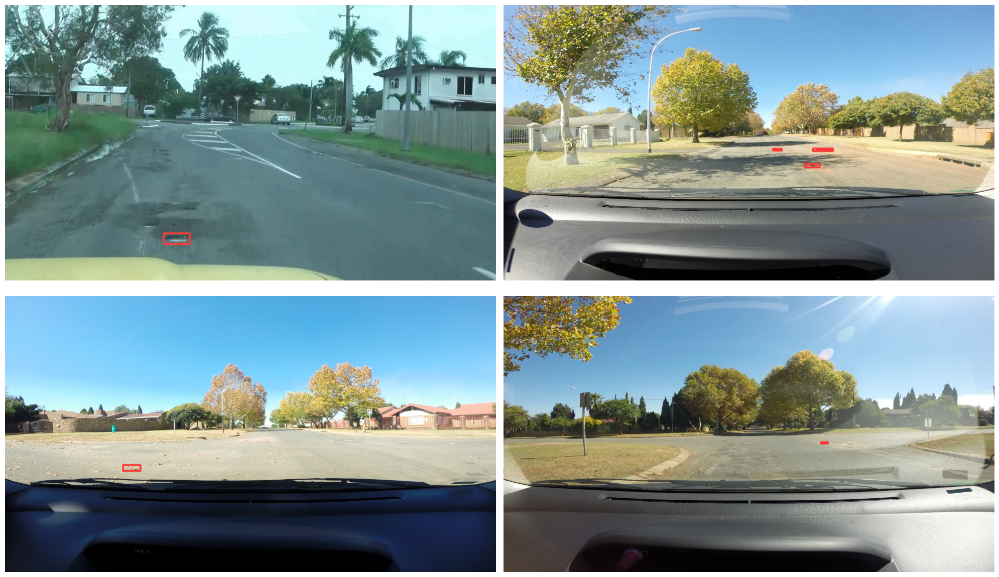

In [ ]:
visualize('runs/detect/yolov8n_v8_50e_infer12802/')

# Yolo small

In [ ]:
! yolo task=detect mode=train model=yolov8s.pt imgsz=1280 data=pothole_v8.yaml epochs=150 patience=10 batch=8   name=yolov8s_v8_50e

100% 21.5M/21.5M [00:01<00:00, 18.2MB/s]
Ultralytics YOLOv8.0.184 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=pothole_v8.yaml, epochs=150, patience=10, batch=8, imgsz=1280, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=yolov8s_v8_50e, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=Fal

In [ ]:
!yolo task=detect mode=val model=best_SMALL.pt name=yolov8s_eval conf=0.4 data=pothole_v8.yaml

Ultralytics YOLOv8.0.190 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla V100-SXM2-16GB, 16151MiB)
Model summary (fused): 168 layers, 11125971 parameters, 0 gradients, 28.4 GFLOPs
val: Scanning /content/datasets/pothole_dataset_v8/valid/labels.cache... 271 images, 0 backgrounds, 0 corrupt: 100% 271/271 [00:00<?, ?it/s]
val: WARNING ⚠️ /content/datasets/pothole_dataset_v8/valid/images/G0011603.jpg: 1 duplicate labels removed
val: WARNING ⚠️ /content/datasets/pothole_dataset_v8/valid/images/G0011614.jpg: 1 duplicate labels removed
val: WARNING ⚠️ /content/datasets/pothole_dataset_v8/valid/images/G0011616.jpg: 2 duplicate labels removed
val: WARNING ⚠️ /content/datasets/pothole_dataset_v8/valid/images/G0011661.jpg: 1 duplicate labels removed
val: WARNING ⚠️ /content/datasets/pothole_dataset_v8/valid/images/G0011662.jpg: 1 duplicate labels removed
val: WARNING ⚠️ /content/datasets/pothole_dataset_v8/valid/images/G0011664.jpg: 1 duplicate labels removed
val: WARNING ⚠️ /content/datasets/po

# Yolo medium

In [ ]:
! yolo task=detect mode=train model=yolov8m.pt imgsz=1280 data=pothole_v8.yaml epochs=150 batch=8 patience=20 name=yolov8m_v8_50e

100% 49.7M/49.7M [00:03<00:00, 15.5MB/s]
Ultralytics YOLOv8.0.184 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=pothole_v8.yaml, epochs=150, patience=20, batch=8, imgsz=1280, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=yolov8m_v8_50e, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=Fal

In [ ]:
!yolo task=detect mode=val model=runs/detect/yolov8m_v8_50e/weights/best.pt name=yolov8s_eval data=pothole_v8.yaml

Ultralytics YOLOv8.0.184 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 218 layers, 25840339 parameters, 0 gradients
val: Scanning /content/datasets/pothole_dataset_v8/valid/labels.cache... 271 images, 0 backgrounds, 0 corrupt: 100% 271/271 [00:00<?, ?it/s]
val: WARNING ⚠️ /content/datasets/pothole_dataset_v8/valid/images/G0011603.jpg: 1 duplicate labels removed
val: WARNING ⚠️ /content/datasets/pothole_dataset_v8/valid/images/G0011614.jpg: 1 duplicate labels removed
val: WARNING ⚠️ /content/datasets/pothole_dataset_v8/valid/images/G0011616.jpg: 2 duplicate labels removed
val: WARNING ⚠️ /content/datasets/pothole_dataset_v8/valid/images/G0011661.jpg: 1 duplicate labels removed
val: WARNING ⚠️ /content/datasets/pothole_dataset_v8/valid/images/G0011662.jpg: 1 duplicate labels removed
val: WARNING ⚠️ /content/datasets/pothole_dataset_v8/valid/images/G0011664.jpg: 1 duplicate labels removed
val: WARNING ⚠️ /content/datasets/pothole_datase

In [ ]:
visualize('runs/detect/yolov8n_v8_50e_infer1280/')

#Augmentation

Use this training configuration

In [ ]:
%%writefile pothole_v8.yaml
path: 'pothole_dataset_v8/'
train: 'train/images'
val: 'valid/images'

# class names
names:
  0: 'pothole'
augmentations:
augmentations:
- Albumentations:
    blur_limit: 7
    brightness_contrast:
      brightness_limit: 0.1
      contrast_limit: 0.1
    crop:
      height: 1024
      width: 1024
    gauss_noise:
      var_limit: (10.0, 50.0)
    hue_saturation:
      hue_shift_limit: 20
      sat_shift_limit: 50
    motion_blur:
      blur_limit: 7
    affine:
      shear: [10, 10]  # shearing with a limit of 10 degrees

# Hyperparameters ------------------------------------------------------------------------------------------------------
    lr0: 0.01  # initial learning rate (i.e. SGD=1E-2, Adam=1E-3)
    lrf: 0.001  # final learning rate (lr0 * lrf)
    momentum: 0.937  # SGD momentum/Adam beta1
    weight_decay: 0.0005  # optimizer weight decay 5e-4
    warmup_epochs: 3.0  # warmup epochs (fractions ok)
    warmup_momentum: 0.8  # warmup initial momentum
    warmup_bias_lr: 0.1  # warmup initial bias lr




Overwriting pothole_v8.yaml


# Fine Tuning

In [ ]:
def freeze_layer(trainer):
    model = trainer.model
    num_freeze = 22
    print(f"Freezing {num_freeze} layers")
    freeze = [f'model.{x}.' for x in range(num_freeze)]  # layers to freeze
    for k, v in model.named_parameters():
        v.requires_grad = True  # train all layers
        if any(x in k for x in freeze):
            print(f'freezing {k}')
            v.requires_grad = False
    print(f"{num_freeze} layers are freezed.")


model = YOLO("yolov8s.pt")
model.add_callback("on_train_start", freeze_layer)
model.train(data='pothole_v8.yaml', epochs=150 , patience= 20 , save =True)

Ultralytics YOLOv8.0.184 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=pothole_v8.yaml, epochs=150, patience=20, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscript, keras=False, op

Freezing 10 layers
freezing model.0.conv.weight
freezing model.0.bn.weight
freezing model.0.bn.bias
freezing model.1.conv.weight
freezing model.1.bn.weight
freezing model.1.bn.bias
freezing model.2.cv1.conv.weight
freezing model.2.cv1.bn.weight
freezing model.2.cv1.bn.bias
freezing model.2.cv2.conv.weight
freezing model.2.cv2.bn.weight
freezing model.2.cv2.bn.bias
freezing model.2.m.0.cv1.conv.weight
freezing model.2.m.0.cv1.bn.weight
freezing model.2.m.0.cv1.bn.bias
freezing model.2.m.0.cv2.conv.weight
freezing model.2.m.0.cv2.bn.weight
freezing model.2.m.0.cv2.bn.bias
freezing model.3.conv.weight
freezing model.3.bn.weight
freezing model.3.bn.bias
freezing model.4.cv1.conv.weight
freezing model.4.cv1.bn.weight
freezing model.4.cv1.bn.bias
freezing model.4.cv2.conv.weight
freezing model.4.cv2.bn.weight
freezing model.4.cv2.bn.bias
freezing model.4.m.0.cv1.conv.weight
freezing model.4.m.0.cv1.bn.weight
freezing model.4.m.0.cv1.bn.bias
freezing model.4.m.0.cv2.conv.weight
freezing model

Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/train3
Starting training for 150 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      1/150      3.19G      2.231      3.062      1.685         33        640: 100%|██████████| 435/435 [00:41<00:00, 10.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.05it/s]
                   all        271        716      0.164      0.151     0.0739     0.0259

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      2/150      3.18G      2.099       2.09      1.526         47        640: 100%|██████████| 435/435 [00:39<00:00, 10.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  7.39it/s]
                   all        271        716      0.221      0.175      0.106     0.0329

 

KeyboardInterrupt: ignored

# Feature Extraction

In [ ]:
def freeze_layer(trainer):
    model = trainer.model
    num_freeze = 10
    print(f"Freezing {num_freeze} layers")
    freeze = [f'model.{x}.' for x in range(num_freeze)]  # layers to freeze
    for k, v in model.named_parameters():
        v.requires_grad = True  # train all layers
        if any(x in k for x in freeze):
            print(f'freezing {k}')
            v.requires_grad = False
    print(f"{num_freeze} layers are freezed.")


model = YOLO("yolov8s.pt.pt")
model.add_callback("on_train_start", freeze_layer)
model.train(data='pothole_v8_aug.yaml', epochs=5 , patience=20 ,save =True)

#Trustworthy evaluation

### Manhole

In [ ]:
model_path = '/content/best.pt'
model = YOLO(model_path)
image_path = '/content/manhole.png'
confidence_threshold = 0.35
results = model.predict(source=image_path, conf=confidence_threshold, save=True, save_txt=True)



image 1/1 /content/manhole.png: 992x1280 1 pothole, 16.2ms
Speed: 12.4ms preprocess, 16.2ms inference, 1.9ms postprocess per image at shape (1, 3, 992, 1280)
Results saved to runs/detect/predict4
1 label saved to runs/detect/predict4/labels


#### Small

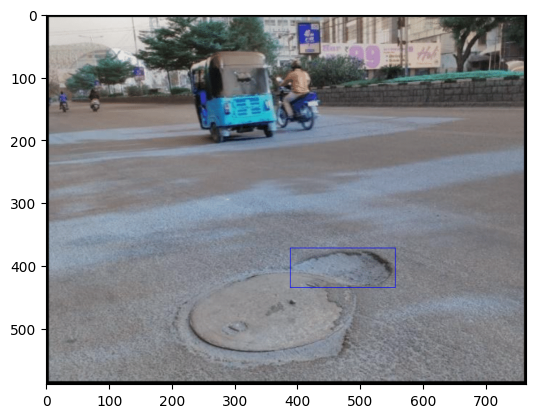

In [ ]:
import cv2
import matplotlib.pyplot as plt

img = cv2.imread('manhole.png')
dh, dw, _ = img.shape

fl = open('/content/runs/detect/predict4/labels/manhole.txt', 'r')
data = fl.readlines()
fl.close()

for dt in data:

    # Split string to float
    _, x, y, w, h = map(float, dt.split(' '))

    # Taken from https://github.com/pjreddie/darknet/blob/810d7f797bdb2f021dbe65d2524c2ff6b8ab5c8b/src/image.c#L283-L291
    # via https://stackoverflow.com/questions/44544471/how-to-get-the-coordinates-of-the-bounding-box-in-yolo-object-detection#comment102178409_44592380
    l = int((x - w / 2) * dw)
    r = int((x + w / 2) * dw)
    t = int((y - h / 2) * dh)
    b = int((y + h / 2) * dh)

    if l < 0:
        l = 0
    if r > dw - 1:
        r = dw - 1
    if t < 0:
        t = 0
    if b > dh - 1:
        b = dh - 1

    cv2.rectangle(img, (l, t), (r, b), (0, 0, 255), 1)

plt.imshow(img)
plt.show()

##Alligator cracking

In [ ]:
model_path = '/content/best.pt'
model = YOLO(model_path)
image_path = '/content/alligator.jpeg'
confidence_threshold = 0.35
results = model.predict(source=image_path, conf=confidence_threshold, save=True, save_txt=True)



image 1/1 /content/alligator.jpeg: 960x1280 (no detections), 644.6ms
Speed: 56.4ms preprocess, 644.6ms inference, 13.4ms postprocess per image at shape (1, 3, 960, 1280)
Results saved to runs/detect/predict
0 label saved to runs/detect/predict/labels


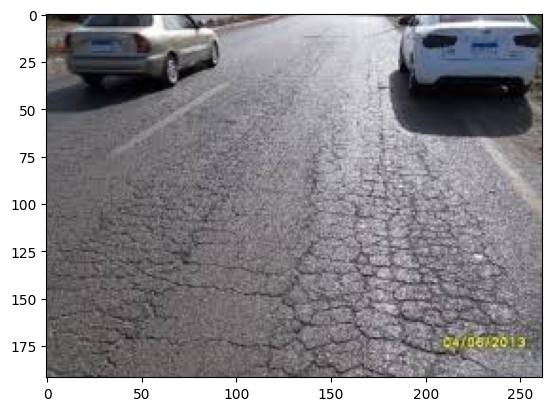

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt

# Load the JPEG image
image_path = '/content/alligator.jpeg'  # Replace with the path to your JPEG image
image = Image.open(image_path)

# Display the image
plt.imshow(image)
plt.axis('on')  # Turn off axis labels
plt.show()


##Patches

In [ ]:
model_path = 'best_SMALL.pt'
model = YOLO(model_path)
image_path = '/content/patches.png'
confidence_threshold = 0.6
results = model.predict(source=image_path, conf=confidence_threshold, save=True, save_txt=True)



image 1/1 /content/patches.png: 1280x1280 1 pothole, 6.9ms
Speed: 15.2ms preprocess, 6.9ms inference, 2.3ms postprocess per image at shape (1, 3, 1280, 1280)
Results saved to runs/detect/predict
1 label saved to runs/detect/predict/labels


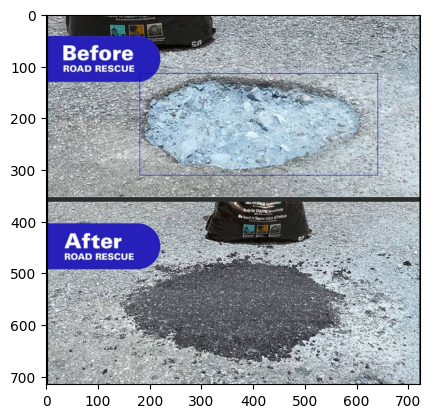

In [ ]:
import cv2
import matplotlib.pyplot as plt

img = cv2.imread('/content/patches.png')
dh, dw, _ = img.shape

fl = open('/content/runs/detect/predict/labels/patches.txt', 'r')
data = fl.readlines()
fl.close()

for dt in data:

    # Split string to float
    _, x, y, w, h = map(float, dt.split(' '))

    # Taken from https://github.com/pjreddie/darknet/blob/810d7f797bdb2f021dbe65d2524c2ff6b8ab5c8b/src/image.c#L283-L291
    # via https://stackoverflow.com/questions/44544471/how-to-get-the-coordinates-of-the-bounding-box-in-yolo-object-detection#comment102178409_44592380
    l = int((x - w / 2) * dw)
    r = int((x + w / 2) * dw)
    t = int((y - h / 2) * dh)
    b = int((y + h / 2) * dh)

    if l < 0:
        l = 0
    if r > dw - 1:
        r = dw - 1
    if t < 0:
        t = 0
    if b > dh - 1:
        b = dh - 1

    cv2.rectangle(img, (l, t), (r, b), (0, 0, 255), 1)

plt.imshow(img)
plt.show()

# Napoli

In [ ]:
model_path = 'best_SMALL.pt'
model = YOLO(model_path)
image_path = '/content/buca_lucci.jpg'
confidence_threshold = 0.6
results = model.predict(source=image_path, conf=confidence_threshold, save=True, save_txt=True)



image 1/1 /content/buca_lucci.jpg: 1280x960 1 pothole, 165.4ms
Speed: 35.9ms preprocess, 165.4ms inference, 43.5ms postprocess per image at shape (1, 3, 1280, 960)
Results saved to runs/detect/predict
1 label saved to runs/detect/predict/labels


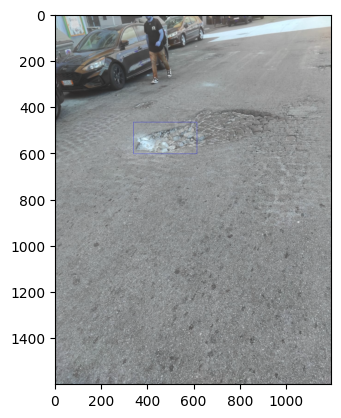

In [ ]:
import cv2
import matplotlib.pyplot as plt

img = cv2.imread('/content/buca_lucci.jpg')
dh, dw, _ = img.shape

fl = open('/content/runs/detect/predict/labels/buca_lucci.txt', 'r')
data = fl.readlines()
fl.close()

for dt in data:

    # Split string to float
    _, x, y, w, h = map(float, dt.split(' '))

    # Taken from https://github.com/pjreddie/darknet/blob/810d7f797bdb2f021dbe65d2524c2ff6b8ab5c8b/src/image.c#L283-L291
    # via https://stackoverflow.com/questions/44544471/how-to-get-the-coordinates-of-the-bounding-box-in-yolo-object-detection#comment102178409_44592380
    l = int((x - w / 2) * dw)
    r = int((x + w / 2) * dw)
    t = int((y - h / 2) * dh)
    b = int((y + h / 2) * dh)

    if l < 0:
        l = 0
    if r > dw - 1:
        r = dw - 1
    if t < 0:
        t = 0
    if b > dh - 1:
        b = dh - 1

    cv2.rectangle(img, (l, t), (r, b), (0, 0, 255), 1)

plt.imshow(img)
plt.show()

In [ ]:
model_path = 'best_SMALL.pt'
model = YOLO(model_path)
image_path = '/content/ripara.jpeg'
confidence_threshold = 0.7
results = model.predict(source=image_path, conf=confidence_threshold, save=True, save_txt=True)



image 1/1 /content/ripara.jpeg: 1280x992 4 potholes, 25.3ms
Speed: 22.8ms preprocess, 25.3ms inference, 2.2ms postprocess per image at shape (1, 3, 1280, 992)
Results saved to runs/detect/predict3
1 label saved to runs/detect/predict3/labels


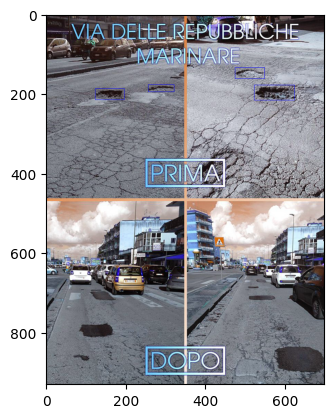

In [ ]:
import cv2
import matplotlib.pyplot as plt

img = cv2.imread('/content/ripara.jpeg')
dh, dw, _ = img.shape

fl = open('/content/runs/detect/predict3/labels/ripara.txt', 'r')
data = fl.readlines()
fl.close()

for dt in data:

    # Split string to float
    _, x, y, w, h = map(float, dt.split(' '))

    # Taken from https://github.com/pjreddie/darknet/blob/810d7f797bdb2f021dbe65d2524c2ff6b8ab5c8b/src/image.c#L283-L291
    # via https://stackoverflow.com/questions/44544471/how-to-get-the-coordinates-of-the-bounding-box-in-yolo-object-detection#comment102178409_44592380
    l = int((x - w / 2) * dw)
    r = int((x + w / 2) * dw)
    t = int((y - h / 2) * dh)
    b = int((y + h / 2) * dh)

    if l < 0:
        l = 0
    if r > dw - 1:
        r = dw - 1
    if t < 0:
        t = 0
    if b > dh - 1:
        b = dh - 1

    cv2.rectangle(img, (l, t), (r, b), (0, 0, 255), 1)

plt.imshow(img)
plt.show()

In [ ]:
model_path = 'best_SMALL.pt'
model = YOLO(model_path)
image_path = '/content/vomero.jpg'
confidence_threshold = 0.7
results = model.predict(source=image_path, conf=confidence_threshold, save=True, save_txt=True)



image 1/1 /content/vomero.jpg: 736x1280 1 pothole, 459.8ms
Speed: 51.7ms preprocess, 459.8ms inference, 48.2ms postprocess per image at shape (1, 3, 736, 1280)
Results saved to runs/detect/predict
1 label saved to runs/detect/predict/labels


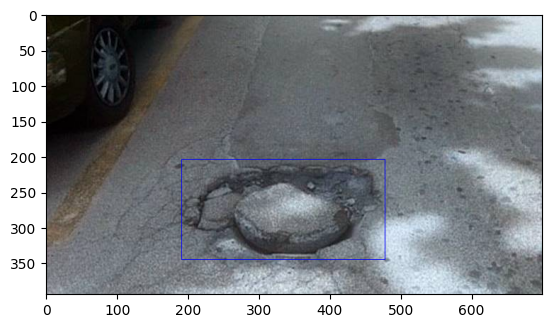

In [ ]:
import cv2
import matplotlib.pyplot as plt

img = cv2.imread('/content/vomero.jpg')
dh, dw, _ = img.shape

fl = open('/content/runs/detect/predict/labels/vomero.txt', 'r')
data = fl.readlines()
fl.close()

for dt in data:

    # Split string to float
    _, x, y, w, h = map(float, dt.split(' '))

    # Taken from https://github.com/pjreddie/darknet/blob/810d7f797bdb2f021dbe65d2524c2ff6b8ab5c8b/src/image.c#L283-L291
    # via https://stackoverflow.com/questions/44544471/how-to-get-the-coordinates-of-the-bounding-box-in-yolo-object-detection#comment102178409_44592380
    l = int((x - w / 2) * dw)
    r = int((x + w / 2) * dw)
    t = int((y - h / 2) * dh)
    b = int((y + h / 2) * dh)

    if l < 0:
        l = 0
    if r > dw - 1:
        r = dw - 1
    if t < 0:
        t = 0
    if b > dh - 1:
        b = dh - 1

    cv2.rectangle(img, (l, t), (r, b), (0, 0, 255), 1)

plt.imshow(img)
plt.show()

In [ ]:
model_path = 'best_SMALL.pt'
model = YOLO(model_path)
image_path = '/content/maddalena_1.jpg'
confidence_threshold = 0.5
results = model.predict(source=image_path, conf=confidence_threshold, save=True, save_txt=True)



image 1/1 /content/maddalena_1.jpg: 832x1280 2 potholes, 10.5ms
Speed: 7.8ms preprocess, 10.5ms inference, 1.9ms postprocess per image at shape (1, 3, 832, 1280)
Results saved to runs/detect/predict5
1 label saved to runs/detect/predict5/labels


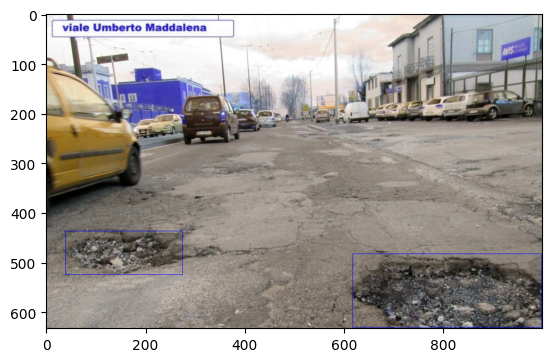

In [ ]:
import cv2
import matplotlib.pyplot as plt

img = cv2.imread('/content/maddalena_1.jpg')
dh, dw, _ = img.shape

fl = open('/content/runs/detect/predict5/labels/maddalena_1.txt', 'r')
data = fl.readlines()
fl.close()

for dt in data:

    # Split string to float
    _, x, y, w, h = map(float, dt.split(' '))

    # Taken from https://github.com/pjreddie/darknet/blob/810d7f797bdb2f021dbe65d2524c2ff6b8ab5c8b/src/image.c#L283-L291
    # via https://stackoverflow.com/questions/44544471/how-to-get-the-coordinates-of-the-bounding-box-in-yolo-object-detection#comment102178409_44592380
    l = int((x - w / 2) * dw)
    r = int((x + w / 2) * dw)
    t = int((y - h / 2) * dh)
    b = int((y + h / 2) * dh)

    if l < 0:
        l = 0
    if r > dw - 1:
        r = dw - 1
    if t < 0:
        t = 0
    if b > dh - 1:
        b = dh - 1

    cv2.rectangle(img, (l, t), (r, b), (0, 0, 255), 1)

plt.imshow(img)
plt.show()

In [ ]:
model_path = 'best_SMALL.pt'
model = YOLO(model_path)
image_path = '/content/acton.jpg'
confidence_threshold = 0.6
results = model.predict(source=image_path, conf=confidence_threshold, save=True, save_txt=True)



image 1/1 /content/acton.jpg: 800x1280 1 pothole, 14.3ms
Speed: 7.6ms preprocess, 14.3ms inference, 2.3ms postprocess per image at shape (1, 3, 800, 1280)
Results saved to runs/detect/predict4
1 label saved to runs/detect/predict4/labels


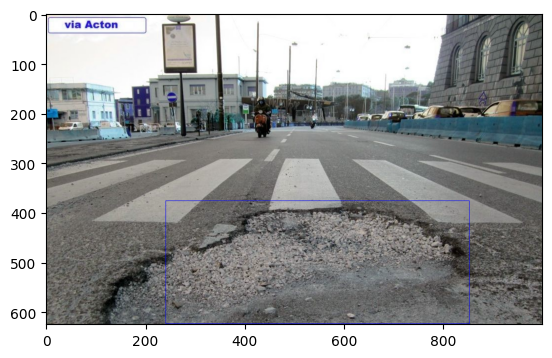

In [ ]:
import cv2
import matplotlib.pyplot as plt

img = cv2.imread('/content/acton.jpg')
dh, dw, _ = img.shape

fl = open('/content/runs/detect/predict3/labels/acton.txt', 'r')
data = fl.readlines()
fl.close()

for dt in data:

    # Split string to float
    _, x, y, w, h = map(float, dt.split(' '))

    # Taken from https://github.com/pjreddie/darknet/blob/810d7f797bdb2f021dbe65d2524c2ff6b8ab5c8b/src/image.c#L283-L291
    # via https://stackoverflow.com/questions/44544471/how-to-get-the-coordinates-of-the-bounding-box-in-yolo-object-detection#comment102178409_44592380
    l = int((x - w / 2) * dw)
    r = int((x + w / 2) * dw)
    t = int((y - h / 2) * dh)
    b = int((y + h / 2) * dh)

    if l < 0:
        l = 0
    if r > dw - 1:
        r = dw - 1
    if t < 0:
        t = 0
    if b > dh - 1:
        b = dh - 1

    cv2.rectangle(img, (l, t), (r, b), (0, 0, 255), 1)

plt.imshow(img)
plt.show()

In [ ]:
import cv2
import matplotlib.pyplot as plt

img = cv2.imread('/content/buca_lucci.jpg')
dh, dw, _ = img.shape

fl = open('/content/runs/detect/predict/labels/buca_lucci.txt', 'r')
data = fl.readlines()
fl.close()

for dt in data:

    # Split string to float
    _, x, y, w, h = map(float, dt.split(' '))

    # Taken from https://github.com/pjreddie/darknet/blob/810d7f797bdb2f021dbe65d2524c2ff6b8ab5c8b/src/image.c#L283-L291
    # via https://stackoverflow.com/questions/44544471/how-to-get-the-coordinates-of-the-bounding-box-in-yolo-object-detection#comment102178409_44592380
    l = int((x - w / 2) * dw)
    r = int((x + w / 2) * dw)
    t = int((y - h / 2) * dh)
    b = int((y + h / 2) * dh)

    if l < 0:
        l = 0
    if r > dw - 1:
        r = dw - 1
    if t < 0:
        t = 0
    if b > dh - 1:
        b = dh - 1

    cv2.rectangle(img, (l, t), (r, b), (0, 0, 255), 1)

plt.imshow(img)
plt.show()

In [ ]:
model_path = 'best_SMALL.pt'
model = YOLO(model_path)
image_path = '/content/de_pretis.jpg'
confidence_threshold = 0.7
results = model.predict(source=image_path, conf=confidence_threshold, save=True, save_txt=True)



image 1/1 /content/de_pretis.jpg: 960x1280 (no detections), 127.1ms
Speed: 27.5ms preprocess, 127.1ms inference, 1.2ms postprocess per image at shape (1, 3, 960, 1280)
Results saved to runs/detect/predict7
0 label saved to runs/detect/predict7/labels


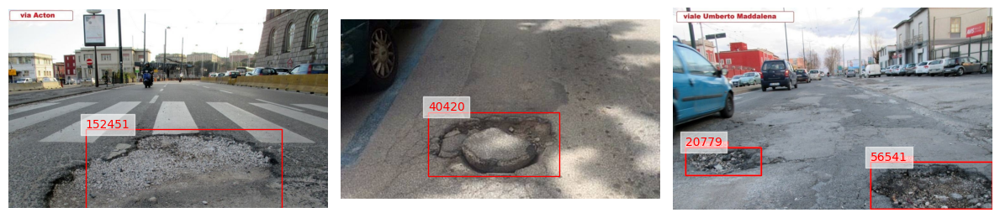

In [ ]:
import os
import random
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import cv2

def plot_images_with_boxes(images_dir, labels_dir, num_images=3):
    image_files = [f for f in os.listdir(images_dir) if f.endswith('.jpg')]
    selected_images = random.sample(image_files, num_images)

    # Determine subplot arrangement
    rows = int(num_images**0.5)
    cols = num_images // rows

    fig, axarr = plt.subplots(rows, cols, figsize=(12, 8))  # Adjusted figure size for visualization

    for idx, image_file in enumerate(selected_images):
        image_path = os.path.join(images_dir, image_file)
        img = cv2.imread(image_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        label_file = os.path.splitext(image_file)[0] + '.txt'
        label_path = os.path.join(labels_dir, label_file)

        ax = axarr[idx // cols, idx % cols] if rows > 1 else axarr[idx]

        if os.path.exists(label_path):
            with open(label_path, 'r') as f:
                lines = f.readlines()
                for line in lines:
                    parts = line.strip().split()
                    x_center, y_center, width, height = map(float, parts[1:5])

                    x_center *= img.shape[1]
                    y_center *= img.shape[0]
                    width *= img.shape[1]
                    height *= img.shape[0]

                    x1 = int(x_center - width/2)
                    y1 = int(y_center - height/2)

                    area = int(width * height)
                    linewidth = 1 + area // (img.shape[1] * img.shape[0])

                    rect = patches.Rectangle((x1, y1), width, height, linewidth=linewidth, edgecolor='r', facecolor='none')
                    ax.add_patch(rect)
                    ax.text(x1, y1 - 5, str(area), color='red', fontsize=10, bbox=dict(facecolor='white', alpha=0.6, edgecolor='white'))

        ax.imshow(img)
        ax.axis('off')

    plt.tight_layout()
    plt.show()

# Specify your image and labels directories
images_dir = '/content/images'
labels_dir = '/content/labels'

plot_images_with_boxes(images_dir, labels_dir)


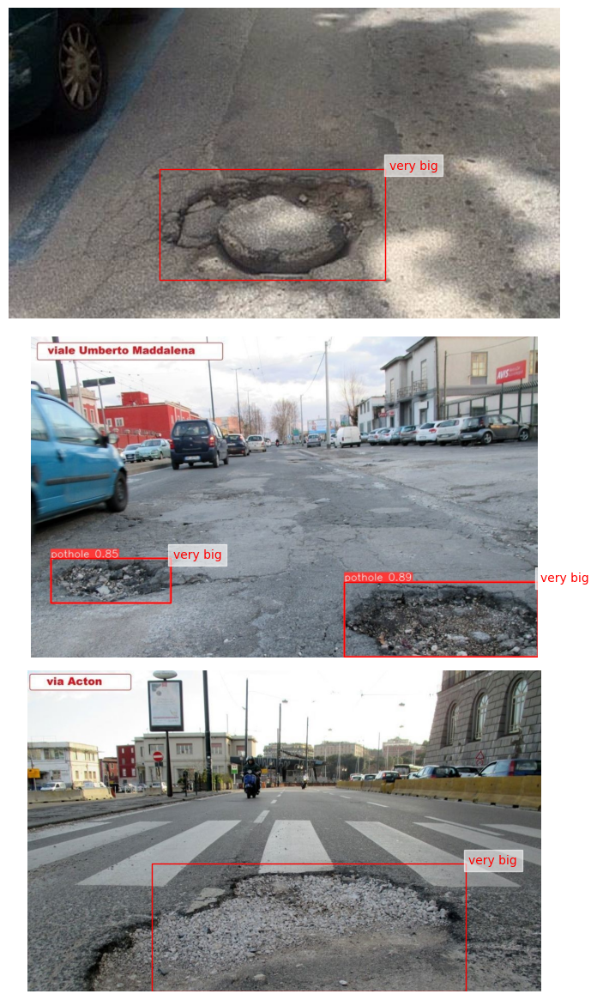

In [ ]:
import os
import random
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import cv2

def plot_images_with_boxes(images_dir, labels_dir, num_images=3):
    image_files = [f for f in os.listdir(images_dir) if f.endswith('.jpg')]
    selected_images = random.sample(image_files, num_images)

    # Get image dimensions for the first image as reference
    reference_img = cv2.imread(os.path.join(images_dir, selected_images[0]))
    img_height, img_width = reference_img.shape[0], reference_img.shape[1]

    fig, axarr = plt.subplots(num_images, 1, figsize=(img_width/100, img_height*num_images/100))

    for idx, image_file in enumerate(selected_images):
        image_path = os.path.join(images_dir, image_file)
        img = cv2.imread(image_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        label_file = os.path.splitext(image_file)[0] + '.txt'
        label_path = os.path.join(labels_dir, label_file)

        if os.path.exists(label_path):
            with open(label_path, 'r') as f:
                lines = f.readlines()
                for line in lines:
                    parts = line.strip().split()
                    x_center, y_center, width, height = float(parts[1]), float(parts[2]), float(parts[3]), float(parts[4])
                    x_center *= img.shape[1]
                    y_center *= img.shape[0]
                    width *= img.shape[1]
                    height *= img.shape[0]

                    x1 = int(x_center - width/2)
                    y1 = int(y_center - height/2)

                    area = int(width * height)
                    if 0 <= area < 1000:
                        color = 'green'
                        size_text = 'small'
                    elif 1000 <= area < 2000:
                        color = 'blue'
                        size_text = 'medium'
                    elif 2000 <= area < 3000:
                        color = 'orange'
                        size_text = 'big'
                    else:
                        color = 'red'
                        size_text = 'very big'

                    linewidth = 1 + area // (img_width * img_height * 10)  # Adjusted for clearer differentiation

                    rect = patches.Rectangle((x1, y1), width, height, linewidth=linewidth, edgecolor=color, facecolor='none')
                    axarr[idx].add_patch(rect)
                    axarr[idx].text(x1 + width + 5, y1, size_text, color=color, fontsize=10, bbox=dict(facecolor='white', alpha=0.6, edgecolor='white'))

        axarr[idx].imshow(img)
        axarr[idx].axis('off')

    # Remove whitespace between subplots
    plt.subplots_adjust(wspace=0, hspace=0)
    plt.tight_layout()
    plt.show()

# Specify your image and labels directories
images_dir = '/content/images'
labels_dir = '/content/labels'

plot_images_with_boxes(images_dir, labels_dir)


In [ ]:
import os
import cv2
import csv

def save_labels_to_csv(images_dir, labels_dir):
    image_files = [f for f in os.listdir(images_dir) if f.endswith('.jpg')]

    # Open CSV file for writing
    with open('potholes_data_2.csv', 'w', newline='') as csvfile:
        csv_writer = csv.writer(csvfile)
        csv_writer.writerow(["Frame Name", "Pothole Area", "Severity", "Location"])  # CSV header

        for image_file in image_files:
            image_path = os.path.join(images_dir, image_file)
            img = cv2.imread(image_path)

            label_file = os.path.splitext(image_file)[0] + '.txt'
            label_path = os.path.join(labels_dir, label_file)

            if os.path.exists(label_path):
                with open(label_path, 'r') as f:
                    lines = f.readlines()
                    for line in lines:
                        parts = line.strip().split()
                        x_center, y_center, width, height = float(parts[1]), float(parts[2]), float(parts[3]), float(parts[4])
                        x_center *= img.shape[1]
                        y_center *= img.shape[0]
                        width *= img.shape[1]
                        height *= img.shape[0]

                        # Check if the pothole is in the center or side of the image
                        if 0.33 * img.shape[1] <= x_center <= 0.67 * img.shape[1]:
                            location = 'center'
                        else:
                            location = 'side'

                        area = int(width * height)
                        if 0 <= area < 1000:
                            size_text = 'small'
                        elif 1000 <= area < 2000:
                            size_text = 'medium'
                        elif 2000 <= area < 3000:
                            size_text = 'big'
                        else:
                            size_text = 'very big'

                        # Write to CSV
                        csv_writer.writerow([image_file, area, size_text, location])

# Specify your image and labels directories
images_dir = '/content/images'
labels_dir = '/content/labels'

save_labels_to_csv(images_dir, labels_dir)


In [ ]:
import pandas as pd

df=pd.read_csv("potholes_data_2.csv")

df_sorted = df.sort_values(by='Pothole Area',ascending=False)

df_sorted

,Frame Name,Pothole Area,Severity,Location
1,acton.jpg,152451,very big,center
2,maddalena_1.jpg,56541,very big,side
0,vomero.jpg,40420,very big,center
3,maddalena_1.jpg,20779,very big,side


In [ ]:
Urgency=[(152451*0.500), (56541*0.660),(40420*0.839),(20779*0.660)]
Urgency

[76225.5, 37317.060000000005, 33912.38, 13714.140000000001]

In [ ]:
# Using loc indexer
df_sorted["Urgency"]=Urgency

In [ ]:
df_sorted

,Frame Name,Pothole Area,Severity,Location,Urgency
1,acton.jpg,152451,very big,center,76225.50
2,maddalena_1.jpg,56541,very big,side,37317.06
0,vomero.jpg,40420,very big,center,33912.38
3,maddalena_1.jpg,20779,very big,side,13714.14


iu periferia: 0.660424

iu centro: 0.500

iu centro residenziale: 0.839017

#Video

In [ ]:
!pip install pytube

In [ ]:
from pytube import YouTube

video_url = 'https://www.youtube.com/watch?v=u5gNoU3bNFg'  # replace with your YouTube video URL
yt = YouTube(video_url)

# List available streams
for stream in yt.streams:
    print(stream)

# Choose a specific stream and download
chosen_stream = yt.streams.filter(res="720p", file_extension="mp4").first()
chosen_stream.download()


<Stream: itag="17" mime_type="video/3gpp" res="144p" fps="6fps" vcodec="mp4v.20.3" acodec="mp4a.40.2" progressive="True" type="video">
<Stream: itag="18" mime_type="video/mp4" res="360p" fps="25fps" vcodec="avc1.42001E" acodec="mp4a.40.2" progressive="True" type="video">
<Stream: itag="22" mime_type="video/mp4" res="720p" fps="25fps" vcodec="avc1.64001F" acodec="mp4a.40.2" progressive="True" type="video">
<Stream: itag="137" mime_type="video/mp4" res="1080p" fps="25fps" vcodec="avc1.640028" progressive="False" type="video">
<Stream: itag="136" mime_type="video/mp4" res="720p" fps="25fps" vcodec="avc1.64001f" progressive="False" type="video">
<Stream: itag="134" mime_type="video/mp4" res="360p" fps="25fps" vcodec="avc1.4d401e" progressive="False" type="video">
<Stream: itag="160" mime_type="video/mp4" res="144p" fps="25fps" vcodec="avc1.4d400c" progressive="False" type="video">
<Stream: itag="139" mime_type="audio/mp4" abr="48kbps" acodec="mp4a.40.5" progressive="False" type="audio">
<S

'/content/datasets/British Road Overrun With Potholes.mp4'

## Extraction of the frames

In [ ]:
import cv2
import os

def extract_frames(video_path, output_path='frames', frames_to_skip=10):
    """Extract frames from a video based on a specified interval.

    Args:
    - video_path (str): Path to the video file.
    - output_path (str): Directory to save the extracted frames.
    - frames_to_skip (int): Number of frames to skip for extraction.

    Returns:
    None
    """

    if not os.path.exists(output_path):
        os.makedirs(output_path)

    cap = cv2.VideoCapture(video_path)
    if not cap.isOpened():
        print(f"Error: Couldn't open video {video_path}")
        return

    fps = int(cap.get(cv2.CAP_PROP_FPS))
    print(f"Video FPS: {fps}")

    # Dynamically set the interval based on FPS
    interval = int(fps / frames_to_skip)
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    print(f"Extracting every {interval} frames")

    saved_count = 0
    for frame_count in range(0, total_frames, interval):
        cap.set(cv2.CAP_PROP_POS_FRAMES, frame_count)  # Set the position to the desired frame
        ret, frame = cap.read()
        if not ret:
            print(f"Error reading frame {frame_count}")
            continue

        # Crop to get the bottom half of the image
        height = frame.shape[0]
        cropped_frame = frame[height//2:, :]

        # Further crop to get the middle quarter of the bottom half
        bottom_half_height = cropped_frame.shape[0]
        quarter_crop = cropped_frame[bottom_half_height//4 : 3*bottom_half_height//4, :]

        filename = os.path.join(output_path, f'frame_{saved_count}.jpg')
        cv2.imwrite(filename, quarter_crop)
        saved_count += 1
        print(f"Saved frame {frame_count} as {filename}")

    cap.release()
    print(f"Extracted and saved {saved_count} frames to {output_path} based on the set interval.")

# Replace with your video path and desired output folder
extract_frames('/content/pothole_video/British Road Overrun With Potholes.mp4', '/content/video_frames_quarter_bottom')


Error: Couldn't open video /content/pothole_video/British Road Overrun With Potholes.mp4


In [ ]:
! yolo task=detect mode=predict model=/content/best_SMALL.pt source='/content/video_frames_quarter_bottom' show=True imgsz=1280 name=yolov8n_v8_50e_infer1280 hide_labels=True  save=True conf= 0.5 save_period=-1 save_txt=True

WARNING ⚠️ 'hide_labels' is deprecated and will be removed in 'ultralytics 8.2' in the future. Please use 'show_labels' instead.
WARNING ⚠️ Environment does not support cv2.imshow() or PIL Image.show()

Ultralytics YOLOv8.0.186 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11125971 parameters, 0 gradients

Traceback (most recent call last):
  File "/usr/local/bin/yolo", line 8, in <module>
    sys.exit(entrypoint())
  File "/usr/local/lib/python3.10/dist-packages/ultralytics/cfg/__init__.py", line 445, in entrypoint
    getattr(model, mode)(**overrides)  # default args from model
  File "/usr/local/lib/python3.10/dist-packages/ultralytics/engine/model.py", line 236, in predict
    return self.predictor.predict_cli(source=source) if is_cli else self.predictor(source=source, stream=stream)
  File "/usr/local/lib/python3.10/dist-packages/ultralytics/engine/predictor.py", line 199, in predict_cli
    for _ in gen:  # running CLI inference

In [ ]:
import os
import shutil

def filter_detected_images():
    # Specify paths
    labels_dir = 'runs/detect/yolov8n_v8_50e_infer1280/labels'
    images_dir = '/content/video_frames_quarter_bottom'
    output_images_dir = 'selected_frames_1/images'
    output_labels_dir = 'selected_frames1/labels'

    # Create the output directories if they don't exist
    if not os.path.exists(output_images_dir):
        os.makedirs(output_images_dir)
    if not os.path.exists(output_labels_dir):
        os.makedirs(output_labels_dir)

    # Copy images with detections and their labels to the output directory
    for label_file in os.listdir(labels_dir):
        # Get the name without the extension
        base_name = os.path.splitext(label_file)[0]
        image_file = base_name + '.jpg'

        # Copy images with corresponding labels to the output directory
        shutil.copy(os.path.join(images_dir, image_file), os.path.join(output_images_dir, image_file))
        # Copy the label file to the output labels directory
        shutil.copy(os.path.join(labels_dir, label_file), os.path.join(output_labels_dir, label_file))

    print(f"Images with detections and their labels have been saved to: {output_images_dir} and {output_labels_dir}")

# To use the function:
filter_detected_images()


Images with detections and their labels have been saved to: selected_frames_1/images and selected_frames1/labels


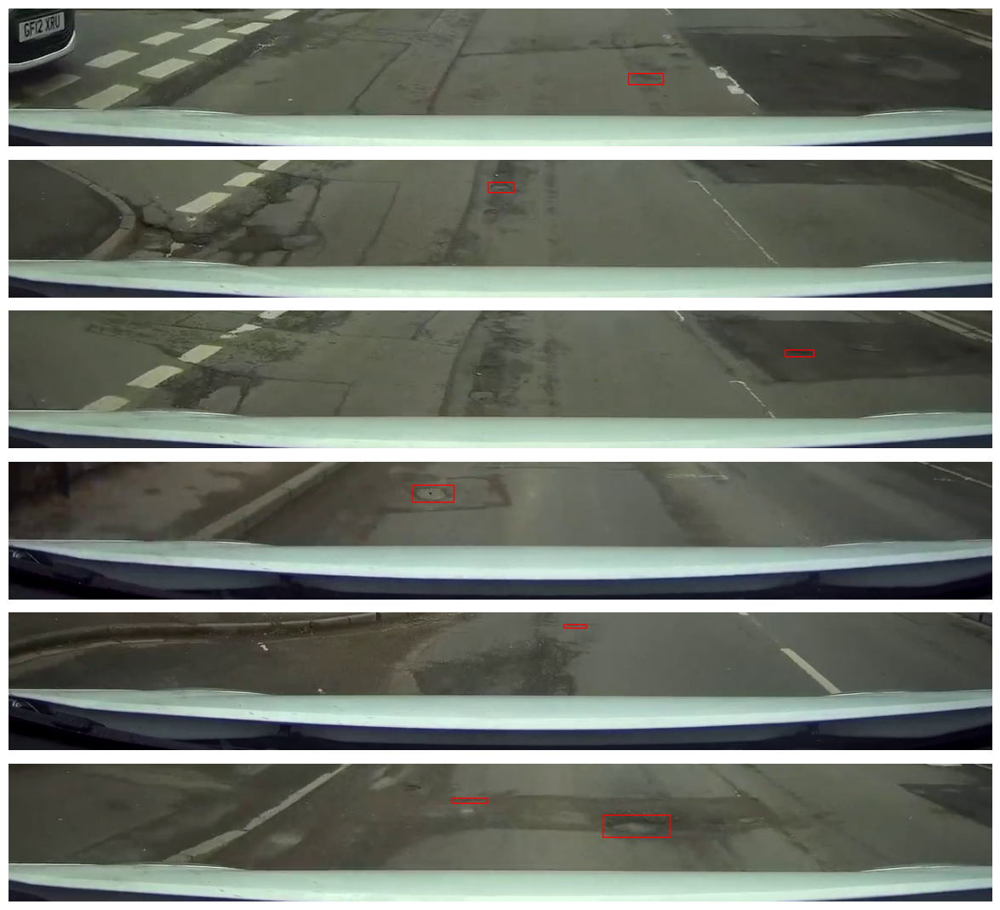

In [ ]:
import os
import random
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import cv2

def plot_images_with_boxes(images_dir, labels_dir, num_images=6):
    image_files = [f for f in os.listdir(images_dir) if f.endswith('.jpg')]
    selected_images = random.sample(image_files, num_images)

    # Get image dimensions for the first image as reference
    reference_img = cv2.imread(os.path.join(images_dir, selected_images[0]))
    img_height, img_width = reference_img.shape[0], reference_img.shape[1]

    fig, axarr = plt.subplots(num_images, 1, figsize=(img_width/100, img_height*num_images/100))

    for idx, image_file in enumerate(selected_images):
        image_path = os.path.join(images_dir, image_file)
        img = cv2.imread(image_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        label_file = os.path.splitext(image_file)[0] + '.txt'
        label_path = os.path.join(labels_dir, label_file)

        if os.path.exists(label_path):
            with open(label_path, 'r') as f:
                lines = f.readlines()
                for line in lines:
                    parts = line.strip().split()
                    x_center, y_center, width, height = float(parts[1]), float(parts[2]), float(parts[3]), float(parts[4])
                    x_center *= img.shape[1]
                    y_center *= img.shape[0]
                    width *= img.shape[1]
                    height *= img.shape[0]

                    x1 = int(x_center - width/2)
                    y1 = int(y_center - height/2)

                    rect = patches.Rectangle((x1,y1),width,height,linewidth=1,edgecolor='r',facecolor='none')
                    axarr[idx].add_patch(rect)

        axarr[idx].imshow(img)
        axarr[idx].axis('off')

    # Remove whitespace between subplots
    plt.subplots_adjust(wspace=0, hspace=0)
    plt.tight_layout()
    plt.show()





# Specify your image and labels directories
images_dir = '/content/selected_frames_1/images'
labels_dir = 'runs/detect/yolov8n_v8_50e_infer1280/labels'

plot_images_with_boxes(images_dir, labels_dir)


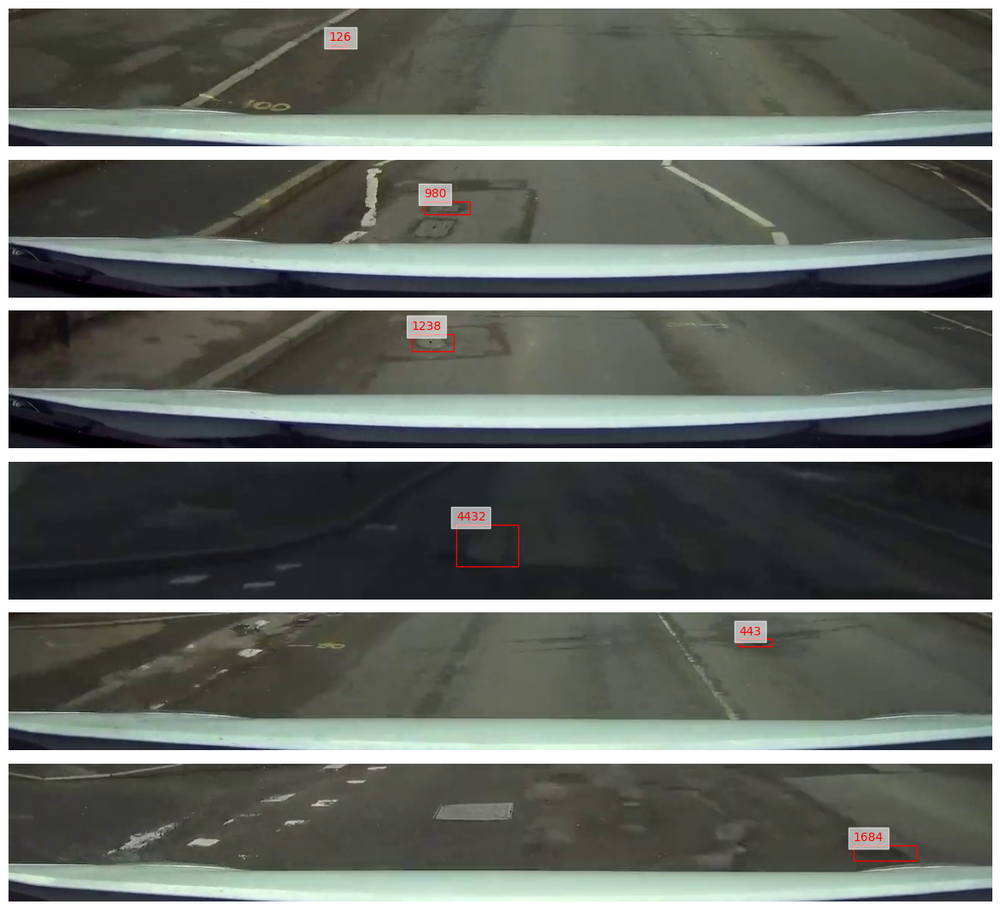

In [ ]:
import os
import random
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import cv2

def plot_images_with_boxes(images_dir, labels_dir, num_images=6):
    image_files = [f for f in os.listdir(images_dir) if f.endswith('.jpg')]
    selected_images = random.sample(image_files, num_images)

    # Get image dimensions for the first image as reference
    reference_img = cv2.imread(os.path.join(images_dir, selected_images[0]))
    img_height, img_width = reference_img.shape[0], reference_img.shape[1]

    fig, axarr = plt.subplots(num_images, 1, figsize=(img_width/100, img_height*num_images/100))

    for idx, image_file in enumerate(selected_images):
        image_path = os.path.join(images_dir, image_file)
        img = cv2.imread(image_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        label_file = os.path.splitext(image_file)[0] + '.txt'
        label_path = os.path.join(labels_dir, label_file)

        if os.path.exists(label_path):
            with open(label_path, 'r') as f:
                lines = f.readlines()
                for line in lines:
                    parts = line.strip().split()
                    x_center, y_center, width, height = float(parts[1]), float(parts[2]), float(parts[3]), float(parts[4])
                    x_center *= img.shape[1]
                    y_center *= img.shape[0]
                    width *= img.shape[1]
                    height *= img.shape[0]

                    x1 = int(x_center - width/2)
                    y1 = int(y_center - height/2)

                    area = int(width * height)
                    linewidth = 1 + area // (img_width * img_height) # You can adjust the scaling factor

                    rect = patches.Rectangle((x1, y1), width, height, linewidth=linewidth, edgecolor='r', facecolor='none')
                    axarr[idx].add_patch(rect)
                    axarr[idx].text(x1, y1 - 5, str(area), color='red', fontsize=10, bbox=dict(facecolor='white', alpha=0.6, edgecolor='white'))

        axarr[idx].imshow(img)
        axarr[idx].axis('off')

    # Remove whitespace between subplots
    plt.subplots_adjust(wspace=0, hspace=0)
    plt.tight_layout()
    plt.show()

# Specify your image and labels directories
images_dir = '/content/selected_frames_1/images'
labels_dir = 'runs/detect/yolov8n_v8_50e_infer1280/labels'

plot_images_with_boxes(images_dir, labels_dir)


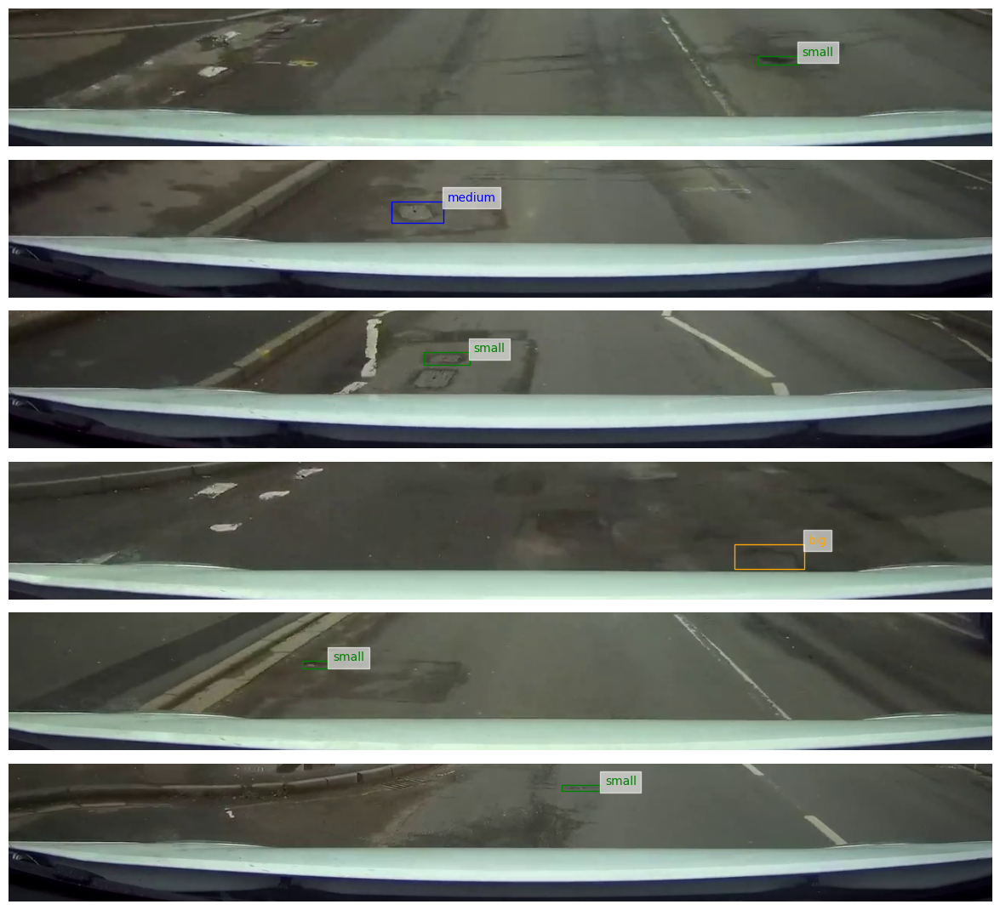

In [ ]:
import os
import random
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import cv2
import csv

def plot_images_with_boxes(images_dir, labels_dir, num_images=6):
    image_files = [f for f in os.listdir(images_dir) if f.endswith('.jpg')]
    selected_images = random.sample(image_files, num_images)

    reference_img = cv2.imread(os.path.join(images_dir, selected_images[0]))
    img_height, img_width = reference_img.shape[0], reference_img.shape[1]

    fig, axarr = plt.subplots(num_images, 1, figsize=(img_width/100, img_height*num_images/100))

    # Open CSV file for writing
    with open('potholes_data_2.csv', 'w', newline='') as csvfile:
        csv_writer = csv.writer(csvfile)
        csv_writer.writerow(["Frame Name", "Image Data", "Pothole Area", "Severity"])  # CSV header

        for idx, image_file in enumerate(selected_images):
            image_path = os.path.join(images_dir, image_file)
            img = cv2.imread(image_path)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

            label_file = os.path.splitext(image_file)[0] + '.txt'
            label_path = os.path.join(labels_dir, label_file)

            if os.path.exists(label_path):
                with open(label_path, 'r') as f:
                    lines = f.readlines()
                    for line in lines:
                        parts = line.strip().split()
                        x_center, y_center, width, height = float(parts[1]), float(parts[2]), float(parts[3]), float(parts[4])
                        x_center *= img.shape[1]
                        y_center *= img.shape[0]
                        width *= img.shape[1]
                        height *= img.shape[0]

                        x1 = int(x_center - width/2)
                        y1 = int(y_center - height/2)

                        area = int(width * height)
                        if 0 <= area < 1000:
                            color = 'green'
                            size_text = 'small'
                        elif 1000 <= area < 2000:
                            color = 'blue'
                            size_text = 'medium'
                        elif 2000 <= area < 3000:
                            color = 'orange'
                            size_text = 'big'
                        else:
                            color = 'red'
                            size_text = 'very big'

                        # Write to CSV
                        csv_writer.writerow([image_file, image_path, area, size_text])

                        # Plotting
                        linewidth = 1 + area // (img_width * img_height * 10)  # Adjusted for clearer differentiation
                        rect = patches.Rectangle((x1, y1), width, height, linewidth=linewidth, edgecolor=color, facecolor='none')
                        axarr[idx].add_patch(rect)
                        axarr[idx].text(x1 + width + 5, y1, size_text, color=color, fontsize=10, bbox=dict(facecolor='white', alpha=0.6, edgecolor='white'))

            axarr[idx].imshow(img)
            axarr[idx].axis('off')

    plt.subplots_adjust(wspace=0, hspace=0)
    plt.tight_layout()
    plt.show()

# Specify your image and labels directories
images_dir = '/content/selected_frames_1/images'
labels_dir = 'runs/detect/yolov8n_v8_50e_infer12802/labels'

plot_images_with_boxes(images_dir, labels_dir)


## Saving Output

In [ ]:
import os
import cv2
import csv

def save_labels_to_csv(images_dir, labels_dir):
    image_files = [f for f in os.listdir(images_dir) if f.endswith('.jpg')]

    # Open CSV file for writing
    with open('potholes_data_2.csv', 'w', newline='') as csvfile:
        csv_writer = csv.writer(csvfile)
        csv_writer.writerow(["Frame Name", "Pothole Area", "Severity", "Location"])  # CSV header

        for image_file in image_files:
            image_path = os.path.join(images_dir, image_file)
            img = cv2.imread(image_path)

            label_file = os.path.splitext(image_file)[0] + '.txt'
            label_path = os.path.join(labels_dir, label_file)

            if os.path.exists(label_path):
                with open(label_path, 'r') as f:
                    lines = f.readlines()
                    for line in lines:
                        parts = line.strip().split()
                        x_center, y_center, width, height = float(parts[1]), float(parts[2]), float(parts[3]), float(parts[4])
                        x_center *= img.shape[1]
                        y_center *= img.shape[0]
                        width *= img.shape[1]
                        height *= img.shape[0]

                        # Check if the pothole is in the center or side of the image
                        if 0.33 * img.shape[1] <= x_center <= 0.67 * img.shape[1]:
                            location = 'center'
                        else:
                            location = 'side'

                        area = int(width * height)
                        if 0 <= area < 1000:
                            size_text = 'small'
                        elif 1000 <= area < 2000:
                            size_text = 'medium'
                        elif 2000 <= area < 3000:
                            size_text = 'big'
                        else:
                            size_text = 'very big'

                        # Write to CSV
                        csv_writer.writerow([image_file, area, size_text, location])

# Specify your image and labels directories
images_dir = '/content/selected_frames_1/images'
labels_dir = 'runs/detect/yolov8n_v8_50e_infer1280/labels'

save_labels_to_csv(images_dir, labels_dir)


#Video 2 (Trasformation)

In [ ]:
!pip install pytube

import cv2
import os
import numpy as np
from pytube import YouTube

# 1. Download the video
video_url = 'https://www.youtube.com/watch?v=u5gNoU3bNFg'  # Replace with your video URL
yt = YouTube(video_url)
ys = yt.streams.get_highest_resolution()
video_filename = ys.download()

# 2. Extract frames at the rate of 1 frame per second
cap = cv2.VideoCapture(video_filename)
fps = int(cap.get(cv2.CAP_PROP_FPS))

frames_dir = 'video_frames_every_second'
if not os.path.exists(frames_dir):
    os.makedirs(frames_dir)

frame_num = 0
while True:
    ret, frame = cap.read()
    if not ret:
        break
    if frame_num % fps == 0:  # Extract every 'fps' frame
        second = frame_num // fps
        frame_filename = os.path.join(frames_dir, f'second_{second}.jpg')
        cv2.imwrite(frame_filename, frame)
    frame_num += 1

cap.release()

# 3. Extract the desired region and apply perspective transformation
output_dir = "transformed_data"
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

for frame_file in os.listdir(frames_dir):
    frame_path = os.path.join(frames_dir, frame_file)
    image = cv2.imread(frame_path)
    height, width = image.shape[:2]

    # Extract the region from 1/2 to 3/4 of the frame
    desired_frame = image[height//2:3*height//4]

    # Define trapezoidal coordinates to achieve a milder face perspective for the near end
    desired_frame_height, desired_frame_width = desired_frame.shape[:2]
    tl = (desired_frame_width//8, 0)
    bl = (0, desired_frame_height)
    tr = (7*desired_frame_width//8, 0)
    br = (desired_frame_width, desired_frame_height)

    # Define rectangle to stretch the trapezoidal region to the full size
    new_tl = (0, 0)
    new_bl = (0, desired_frame_height)
    new_tr = (desired_frame_width, 0)
    new_br = (desired_frame_width, desired_frame_height)

    pts1 = np.float32([tl, bl, tr, br])
    pts2 = np.float32([new_tl, new_bl, new_tr, new_br])

    matrix = cv2.getPerspectiveTransform(pts1, pts2)
    transformed_frame = cv2.warpPerspective(desired_frame, matrix, (desired_frame_width, desired_frame_height))

    output_path = os.path.join(output_dir, frame_file)
    cv2.imwrite(output_path, transformed_frame)

cv2.destroyAllWindows()


In [ ]:
import cv2
import os
import numpy as np
from pytube import YouTube

# 1. Download the video
video_url = 'https://www.youtube.com/watch?v=u5gNoU3bNFg'  # Replace with your video URL
yt = YouTube(video_url)
ys = yt.streams.get_highest_resolution()
video_filename = ys.download()

# 2. Extract frames at the rate of 1 frame every 10 frames
cap = cv2.VideoCapture(video_filename)

frames_dir = 'video_frames_every_10_frames'
if not os.path.exists(frames_dir):
    os.makedirs(frames_dir)

frame_num = 0
while True:
    ret, frame = cap.read()
    if not ret:
        break
    if frame_num % 10 == 0:  # Extract every 10th frame
        frame_filename = os.path.join(frames_dir, f'frame_{frame_num}.jpg')
        cv2.imwrite(frame_filename, frame)
    frame_num += 1

cap.release()

# 3. Extract the desired region and apply perspective transformation
output_dir = "transformed_data"
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

for frame_file in os.listdir(frames_dir):
    frame_path = os.path.join(frames_dir, frame_file)
    image = cv2.imread(frame_path)
    height, width = image.shape[:2]

    # Extract the region from 1/2 to 3/4 of the frame
    desired_frame = image[height//2:3*height//4]

    # Define trapezoidal coordinates to achieve a milder face perspective for the near end
    desired_frame_height, desired_frame_width = desired_frame.shape[:2]
    tl = (desired_frame_width//8, 0)
    bl = (0, desired_frame_height)
    tr = (7*desired_frame_width//8, 0)
    br = (desired_frame_width, desired_frame_height)

    # Define rectangle to stretch the trapezoidal region to the full size
    new_tl = (0, 0)
    new_bl = (0, desired_frame_height)
    new_tr = (desired_frame_width, 0)
    new_br = (desired_frame_width, desired_frame_height)

    pts1 = np.float32([tl, bl, tr, br])
    pts2 = np.float32([new_tl, new_bl, new_tr, new_br])

    matrix = cv2.getPerspectiveTransform(pts1, pts2)
    transformed_frame = cv2.warpPerspective(desired_frame, matrix, (desired_frame_width, desired_frame_height))

    output_path = os.path.join(output_dir, frame_file)
    cv2.imwrite(output_path, transformed_frame)

cv2.destroyAllWindows()


In [ ]:

#elimina un intero folder
!rm -rf /content/video_frames_every_half_second/

#elimina un intero folder
!rm -rf /content/transformed_data/
!rm -rf /content/selected_frames//

#elimina un intero folder
!rm -rf /content/video_frames_every_second/

In [ ]:
! yolo task=detect mode=predict model=/content/best_SMALL.pt source='/content/transformed_data' show=True imgsz=1280 name=yolov8n_v8_50e_infer1280 hide_labels=True  save=True conf= 0.5 save_period=-1 save_txt=True

WARNING ⚠️ 'hide_labels' is deprecated and will be removed in 'ultralytics 8.2' in the future. Please use 'show_labels' instead.
WARNING ⚠️ Environment does not support cv2.imshow() or PIL Image.show()

Ultralytics YOLOv8.0.187 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11125971 parameters, 0 gradients

image 1/196 /content/transformed_data/frame_0.jpg: 192x1280 (no detections), 121.3ms
image 2/196 /content/transformed_data/frame_10.jpg: 192x1280 (no detections), 13.0ms
image 3/196 /content/transformed_data/frame_100.jpg: 192x1280 (no detections), 12.9ms
image 4/196 /content/transformed_data/frame_1000.jpg: 192x1280 (no detections), 12.9ms
image 5/196 /content/transformed_data/frame_1010.jpg: 192x1280 (no detections), 12.9ms
image 6/196 /content/transformed_data/frame_1020.jpg: 192x1280 (no detections), 12.9ms
image 7/196 /content/transformed_data/frame_1030.jpg: 192x1280 (no detections), 12.9ms
image 8/196 /content/transformed_dat

In [ ]:
import os
import shutil

def filter_detected_images():
    # Specify paths
    labels_dir = 'runs/detect/yolov8n_v8_50e_infer12803/labels'
    images_dir = '/content/transformed_data'
    output_images_dir = 'selected_frames/images'
    output_labels_dir = 'selected_frames/labels'

    # Create the output directories if they don't exist
    if not os.path.exists(output_images_dir):
        os.makedirs(output_images_dir)
    if not os.path.exists(output_labels_dir):
        os.makedirs(output_labels_dir)

    # Copy images with detections and their labels to the output directory
    for label_file in os.listdir(labels_dir):
        # Get the name without the extension
        base_name = os.path.splitext(label_file)[0]
        image_file = base_name + '.jpg'

        # Copy images with corresponding labels to the output directory
        shutil.copy(os.path.join(images_dir, image_file), os.path.join(output_images_dir, image_file))
        # Copy the label file to the output labels directory
        shutil.copy(os.path.join(labels_dir, label_file), os.path.join(output_labels_dir, label_file))

    print(f"Images with detections and their labels have been saved to: {output_images_dir} and {output_labels_dir}")

# To use the function:
filter_detected_images()


Images with detections and their labels have been saved to: selected_frames/images and selected_frames/labels


In [ ]:
import os
import random
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import cv2
import csv

def plot_images_with_boxes(images_dir, labels_dir, num_images=6):
    image_files = [f for f in os.listdir(images_dir) if f.endswith('.jpg')]
    selected_images = random.sample(image_files, num_images)

    reference_img = cv2.imread(os.path.join(images_dir, selected_images[0]))
    img_height, img_width = reference_img.shape[0], reference_img.shape[1]

    fig, axarr = plt.subplots(num_images, 1, figsize=(img_width/100, img_height*num_images/100))

    # Open CSV file for writing
    with open('potholes_data_2.csv', 'w', newline='') as csvfile:
        csv_writer = csv.writer(csvfile)
        csv_writer.writerow(["Frame Name", "Image Data", "Pothole Area", "Severity"])  # CSV header

        for idx, image_file in enumerate(selected_images):
            image_path = os.path.join(images_dir, image_file)
            img = cv2.imread(image_path)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

            label_file = os.path.splitext(image_file)[0] + '.txt'
            label_path = os.path.join(labels_dir, label_file)

            if os.path.exists(label_path):
                with open(label_path, 'r') as f:
                    lines = f.readlines()
                    for line in lines:
                        parts = line.strip().split()
                        x_center, y_center, width, height = float(parts[1]), float(parts[2]), float(parts[3]), float(parts[4])
                        x_center *= img.shape[1]
                        y_center *= img.shape[0]
                        width *= img.shape[1]
                        height *= img.shape[0]

                        x1 = int(x_center - width/2)
                        y1 = int(y_center - height/2)

                        area = int(width * height)
                        if 0 <= area < 1000:
                            color = 'green'
                            size_text = 'small'
                        elif 1000 <= area < 2000:
                            color = 'blue'
                            size_text = 'medium'
                        elif 2000 <= area < 3000:
                            color = 'orange'
                            size_text = 'big'
                        else:
                            color = 'red'
                            size_text = 'very big'

                        # Write to CSV
                        csv_writer.writerow([image_file, image_path, area, size_text])

                        # Plotting
                        linewidth = 1 + area // (img_width * img_height * 10)  # Adjusted for clearer differentiation
                        rect = patches.Rectangle((x1, y1), width, height, linewidth=linewidth, edgecolor=color, facecolor='none')
                        axarr[idx].add_patch(rect)
                        axarr[idx].text(x1 + width + 5, y1, size_text, color=color, fontsize=10, bbox=dict(facecolor='white', alpha=0.6, edgecolor='white'))

            axarr[idx].imshow(img)
            axarr[idx].axis('off')

    plt.subplots_adjust(wspace=0, hspace=0)
    plt.tight_layout()
    plt.show()

# # Specify your image and labels directories
# images_dir = '/content/selected_frames/images'
# labels_dir = 'runs/detect/yolov8n_v8_50e_infer1280/labels'

# plot_images_with_boxes(images_dir, labels_dir)


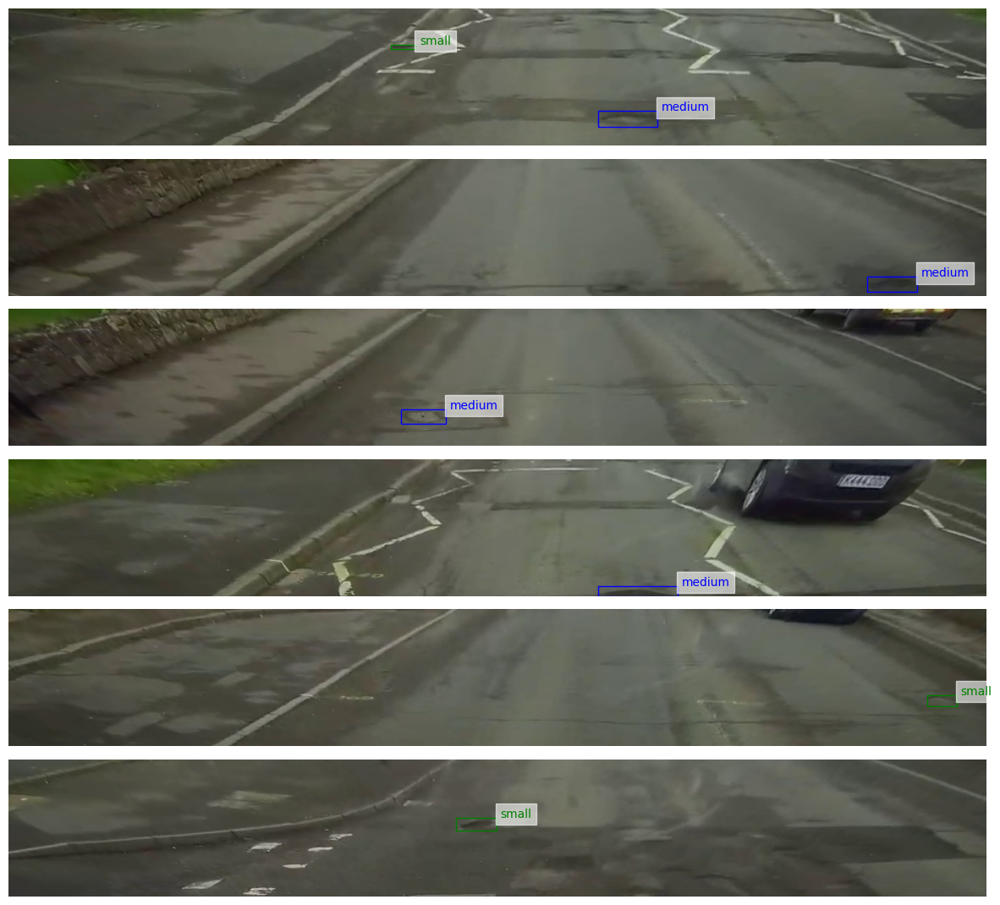

In [ ]:
# Specify your image and labels directories
images_dir = '/content/selected_frames/images'
labels_dir = 'runs/detect/yolov8n_v8_50e_infer12803/labels'

plot_images_with_boxes(images_dir, labels_dir)

In [ ]:
import os
import cv2
import csv

def save_labels_to_csv(images_dir, labels_dir):
    image_files = [f for f in os.listdir(images_dir) if f.endswith('.jpg')]

    # Open CSV file for writing
    with open('potholes_data_2.csv', 'w', newline='') as csvfile:
        csv_writer = csv.writer(csvfile)
        csv_writer.writerow(["Frame Name", "Pothole Area", "Severity", "Location"])  # CSV header

        for image_file in image_files:
            image_path = os.path.join(images_dir, image_file)
            img = cv2.imread(image_path)

            label_file = os.path.splitext(image_file)[0] + '.txt'
            label_path = os.path.join(labels_dir, label_file)

            if os.path.exists(label_path):
                with open(label_path, 'r') as f:
                    lines = f.readlines()
                    for line in lines:
                        parts = line.strip().split()
                        x_center, y_center, width, height = float(parts[1]), float(parts[2]), float(parts[3]), float(parts[4])
                        x_center *= img.shape[1]
                        y_center *= img.shape[0]
                        width *= img.shape[1]
                        height *= img.shape[0]

                        # Check if the pothole is in the center or side of the image
                        if 0.33 * img.shape[1] <= x_center <= 0.67 * img.shape[1]:
                            location = 'center'
                        else:
                            location = 'side'

                        area = int(width * height)
                        if 0 <= area < 1000:
                            size_text = 'small'
                        elif 1000 <= area < 2000:
                            size_text = 'medium'
                        elif 2000 <= area < 3000:
                            size_text = 'big'
                        else:
                            size_text = 'very big'

                        # Write to CSV
                        csv_writer.writerow([image_file, area, size_text, location])

# Specify your image and labels directories
images_dir = '/content/selected_frames/images'
labels_dir = 'runs/detect/yolov8n_v8_50e_infer12803/labels'

save_labels_to_csv(images_dir, labels_dir)
